In [3]:
import os
import numpy as np
from scipy.optimize import minimize
import scipy
import AXEAP
import shutil
from datetime import datetime
import glob
import sys
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import pandas as pd
import step1_f_ni
import step1_f_mn
from skopt.plots import plot_gaussian_process
from skopt import gp_minimize
import pickle
from skopt import load, dump
from sklearn.metrics import root_mean_squared_error
from skopt import callbacks
from skopt.callbacks import CheckpointSaver
from pathlib import Path

# Stick Generation and Convolution

### Read in test data

In [2]:
hs_df = pd.read_pickle("Fdd_10Dq_rGpd_hsspecs.pkl")

hs_df.reset_index(drop = True, inplace=True)
gpd_vals = hs_df["Gpd"].to_numpy(dtype="float")
fdd_vals = hs_df["Fdd"].to_numpy(dtype="float")
tdq_vals = hs_df["10Dq"].to_numpy(dtype="float")

hs_df

FileNotFoundError: [Errno 2] No such file or directory: 'Fdd_10Dq_rGpd_hsspecs.pkl'

### Define Bayesian Optimization functions

In [4]:
# Function to generate Lorentzian convolution
def convG(x, x1, fv, dE):
    return 2*np.sqrt(np.log(2))*np.exp(-4*np.log(2)*np.square((x-x1+dE)/fv))/(fv*np.sqrt(np.pi))

# Function to generate Gaussian convolution
def convL(x, x1, fv, dE):
    return fv/(2*np.pi*(np.square(fv/2)+np.square(x-x1+dE)))

# Function to generate psuedo voigt spectra from stick data
def pvoigt_gen(x, G1, L1, L2, dE, dI, SP, stick_x, stick_y):
    # Define FWHM of Voigt function before and after splitting point
    fv1 = 0.5346*2*L1 + 2*np.sqrt(0.2166*L1**2+G1**2)
    fv2 = 0.5346*2*L2 + 2*np.sqrt(0.2166*L2**2+G1**2)

    # Define eta values before and after splitting point
    Eta1 = 1.36603*(2*L1/fv1)-0.47719*pow(2*L1/fv1,2) + 0.11116*pow(2*L1/fv1,3)
    Eta2 = 1.36603*(2*L2/fv2)-0.47719*pow(2*L2/fv2,2) + 0.11116*pow(2*L2/fv2,3)

    # Define the set of points that are represented by 
    x1 = stick_x
    y1 = stick_y
    gx1 = x1[x1>=SP]
    gx2 = x1[x1<SP]
    gy1 = y1[x1>=SP]
    gy2 = y1[x1<SP]

    x11 = np.repeat(x[:, np.newaxis], gx1.shape[0], axis=1)
    x12 = np.repeat(x[:, np.newaxis], gx2.shape[0], axis=1)
    y11 = gy1*((1-Eta1)*convG(x11, gx1, fv1, dE)+Eta1*convL(x11, gx1, fv1, dE))
    y12 = gy2*((1-Eta2)*convG(x12, gx2, fv2, dE)+Eta2*convL(x12, gx2, fv2, dE))

    y = dI*(np.sum(y11, axis=1) + np.sum(y12, axis=1))
    return y


# Function to fit convolution to stick spectra based on experimental spectra using fixed splitting point
def nls_fit_spc(stick_x, stick_y, exp_x, exp_y, sp):

    # bounds = ([0.5, 0.5, 1, -10, 0.01, 6480], [2, 4, 10, 10, 2.0, 6500])
    # bounds = ((0.5,2), (0.5,4), (1,10), (-10,10), (0.01, 2), (6480,6500))
    bounds = ((0.5,4), (1,10), (-10,10), (0.01, 2))
    
    # Function to generate spectrum from stick data
    def func(x):
        # Generate spectra
        y = pvoigt_gen(exp_x, G1, *x, sp, stick_x, stick_y)

        # Return loss
        err = np.linalg.norm(y-exp_y)
        # print(err)
        return err
    

    # err = func(x, 0.5, 1.2, 4.0, -4.5, 0.1, 6489)
    # print(err)
    ini_x = np.array([1.46, 2.02, -4.29, 1])
    # mat_x = np.array([0.5, 1.49, 4.84, 3.67, 0.878])
    # res = minimize(func, ini_x, bounds=bounds)
    res = minimize(func, ini_x, bounds=bounds)
    
    
    err = func(res.x)
    # mat_err = func(mat_x)
    # print(f"Final Error: {err}")
    # print(f"Matlab Error: {mat_err}")
    return res

# Generate error landscape

### Iterate through each spectra and test points

In [3]:
# Define width we want to test at
tdq_wid = .5
fdd_wid = 5
tdq_range = 15
fdd_range = 15

n_calls = tdq_range*fdd_range

for i, spec in enumerate(hs_df["Spectrum"]):

    exp_x = spec["xData"].to_numpy(dtype=float)
    exp_y = spec["yData"].to_numpy(dtype=float)
    fdd = fdd_vals[i]
    tdq = tdq_vals[i] 
    gpd = gpd_vals[i]

    # Define arrays of points to evaluate
    tdq_arr = np.linspace(tdq-tdq_wid, tdq+tdq_wid, tdq_range)
    fdd_arr = np.linspace(fdd-fdd_wid, fdd+fdd_wid, fdd_range)

    # Generate space of points that we want to call. 
    tdq_pts, fdd_pts = np.meshgrid(tdq_arr, fdd_arr)
    tdq_pts = np.ravel(tdq_pts)
    fdd_pts = np.ravel(fdd_pts)
    gpd_pts = np.full_like(tdq_pts, gpd)
    err_pts = np.zeros_like(tdq_pts)
    x_pts = np.vstack((gpd_pts, fdd_pts, tdq_pts))

    # Evaluate spectrum and error at each point 
    for i, fdd in enumerate(fdd_pts):
        tdq = tdq_pts[i]

        # Generate sticks and convolute function
        stick_x, stick_y = step1_f.gen_sticks(gpd=gpd, tdq=tdq, fdd=fdd)

        sp = 6486.2
        res = nls_fit_spc(stick_x, stick_y, exp_x, exp_y, sp)
        spec = pvoigt_gen(exp_x, *res.x, sp, stick_x, stick_y)
        err = np.linalg.norm(spec-exp_y)
        err_pts[i] = err

    

    np.save(f"./hs_3var_err_land/bo_3p_{n_calls}i_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_vals[i]}_x_iters.npy", x_pts)
    np.save(f"./hs_3var_err_land/bo_3p_{n_calls}i_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_vals[i]}_y_iters.npy", err_pts)

NameError: name 'hs_df' is not defined

# Ni2+ Error Landscape

## $F_{dd}$, $10Dq$ Error Landscape

### Read in test data

In [3]:
hs_df = pd.read_pickle("ni3+_3var_lstspecs.pkl")

hs_df.reset_index(drop = True, inplace=True)
hs_df["PE"] = hs_df["10Dq"]/hs_df["Fdd"] * 100
hs_df.sort_values(by="PE", ascending=True, inplace=True)
gpd_vals = hs_df["Gpd"].to_numpy(dtype="float")
fdd_vals = hs_df["Fdd"].to_numpy(dtype="float")
tdq_vals = hs_df["10Dq"].to_numpy(dtype="float")

hs_df

,Fdd,10Dq,Gpd,Spectrum,SpinState,PE
13,77.987939,2.347467,54.982188,xData yData 0 8230.00 0.000599 ...,LS,3.010038
27,88.285090,2.669976,83.192159,xData yData 0 8230.00 0.000671 ...,LS,3.024266
6,90.422525,2.747045,87.164169,xData yData 0 8230.00 0.000681 ...,LS,3.038010
14,78.191271,2.421760,73.444923,xData yData 0 8230.00 0.000643 ...,LS,3.097225
26,35.881074,1.130541,66.615361,xData yData 0 8230.00 0.000616 ...,LS,3.150800
17,80.504184,2.579331,72.419038,xData yData 0 8230.00 0.000626 ...,LS,3.203972
10,38.699829,1.254806,67.211949,xData yData 0 8230.00 0.000621 ...,LS,3.242407
29,91.353896,2.988054,53.145201,xData yData 0 8230.00 0.000580 ...,LS,3.270855
15,57.224500,1.920711,72.163620,xData yData 0 8230.00 0.000634 ...,LS,3.356448
28,46.755861,1.651091,64.601846,xData yData 0 8230.00 0.000609 ...,LS,3.531303


### Plot landscape by 10Dq value

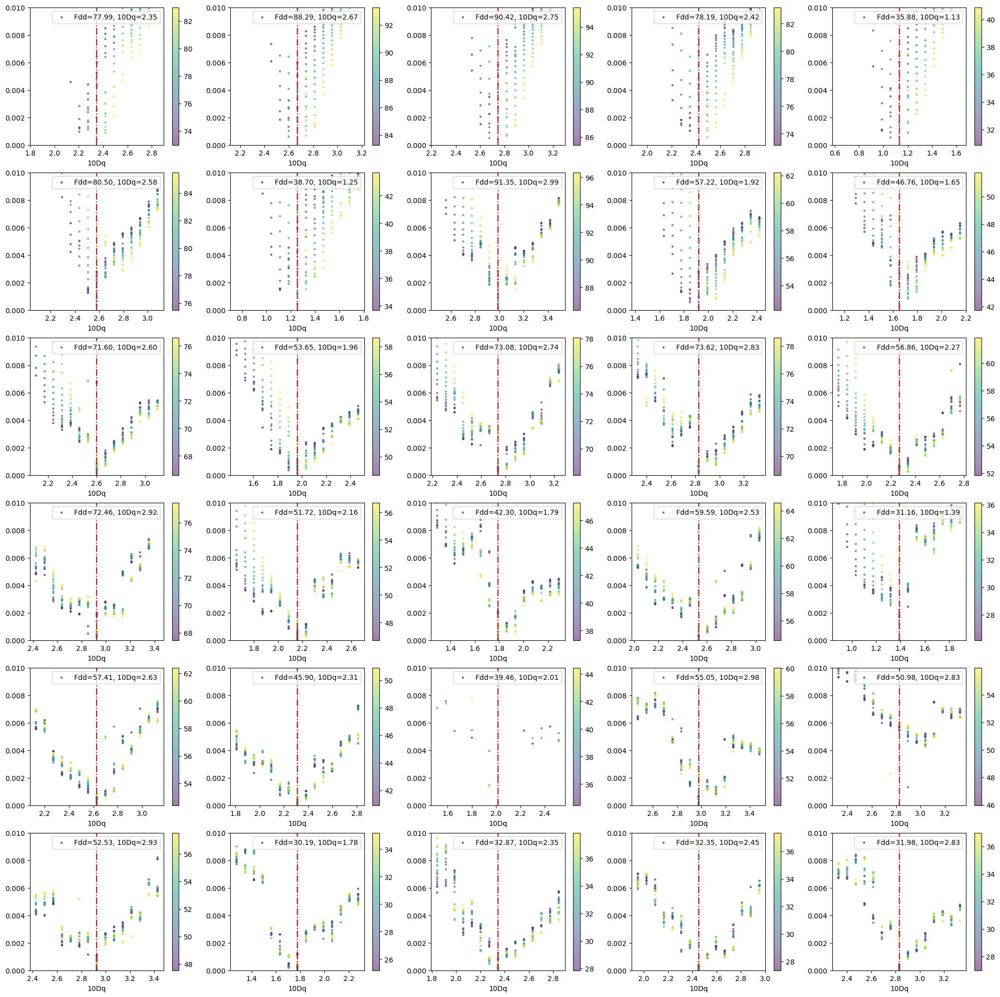

In [22]:
# Define width we want to test at
tdq_wid = .5
fdd_wid = 5
tdq_range = 15
fdd_range = 20

# Define plotting parameters
fig, axs = plt.subplots(6, 5, figsize=(25, 25))

n = 25
iters = np.arange(0, 10)

on_pts = 0
off_pts = 0

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./linio2_eval/fdd_tdq_err_land/{gpd_vals[i]}_{tdq_vals[i]}_{fdd_vals[i]}_{fdd_wid}_{tdq_wid}_x.npy"
    file = Path(fname)
    # print(fname)
    if file.exists():

        x_pts = np.squeeze(np.load(fname))
        y_pts = np.squeeze(np.load(f"./linio2_eval/fdd_tdq_err_land/{gpd_vals[i]}_{tdq_vals[i]}_{fdd_vals[i]}_{fdd_wid}_{tdq_wid}_y.npy"))
        gpd_pts = x_pts[0]
        fdd_pts = x_pts[1]
        tdq_pts = x_pts[2]
    
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(tdq_pts, y_pts, c=fdd_pts, cmap="viridis", label=f"Fdd={fdd_vals[i]:0.2f}, 10Dq={tdq_vals[i]:0.2f}", s=5, alpha=0.5)
        axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("10Dq")
        cb = fig.colorbar(mp, ax=axs[r, c])
        # cb.set_label(label="Iter", size=16)

        sol_y = np.linspace(0, 0.02, 100)
        sol_x = np.full_like(sol_y, tdq_vals[i])
        axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

plt.show()
# print(on_pts/(on_pts+off_pts))
# plt.savefig(f"./figures/hs_spec/hs_spec_tdqerr_{n_calls}i_stdxi.png")

### Plot landscape by Fdd value

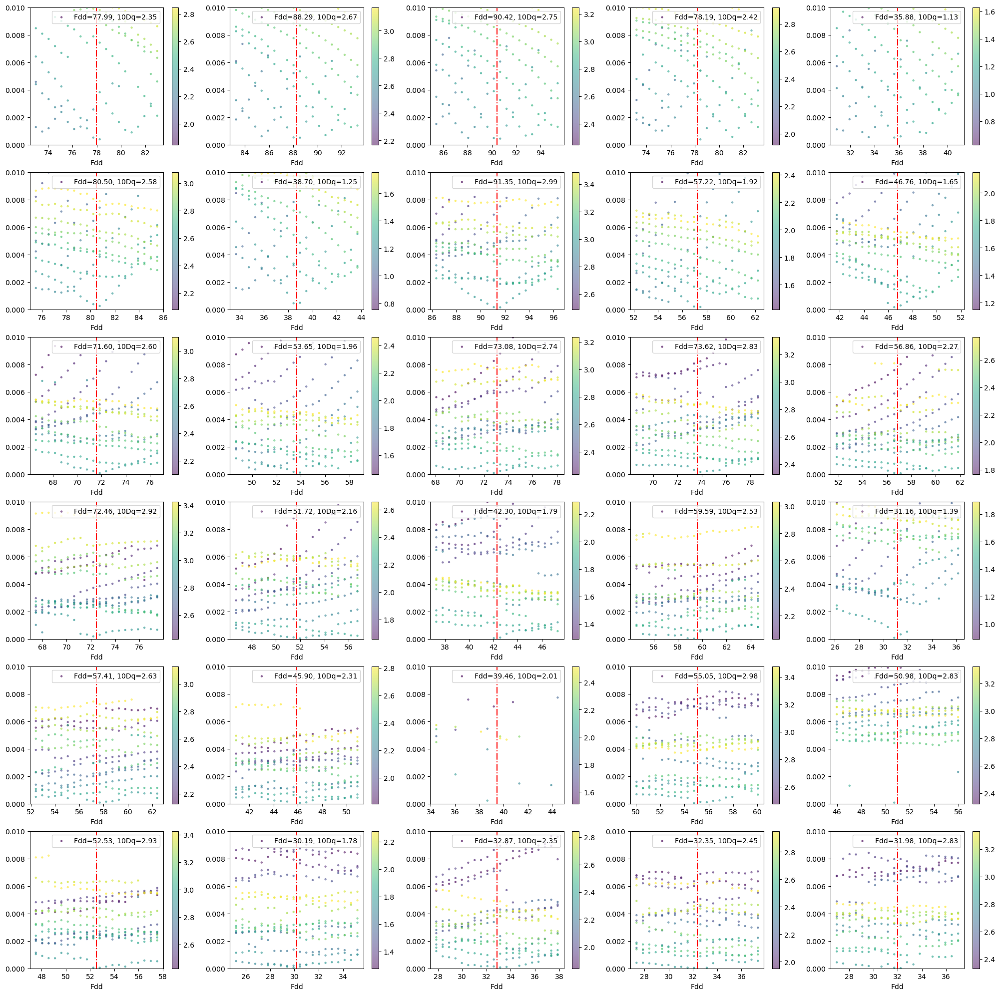

In [4]:
# Define width we want to test at
tdq_wid = .5
fdd_wid = 5
tdq_range = 15
fdd_range = 15

# Define plotting parameters
fig, axs = plt.subplots(6, 5, figsize=(25, 25))

n = 25
iters = np.arange(0, 10)

on_pts = 0
off_pts = 0

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./linio2_eval/fdd_tdq_err_land/{gpd_vals[i]}_{tdq_vals[i]}_{fdd_vals[i]}_{fdd_wid}_{tdq_wid}_x.npy"
    file = Path(fname)
    # print(fname)
    if file.exists():

        x_pts = np.squeeze(np.load(fname))
        y_pts = np.squeeze(np.load(f"./linio2_eval/fdd_tdq_err_land/{gpd_vals[i]}_{tdq_vals[i]}_{fdd_vals[i]}_{fdd_wid}_{tdq_wid}_y.npy"))
        gpd_pts = x_pts[0]
        fdd_pts = x_pts[1]
        tdq_pts = x_pts[2]
    
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fdd_pts, y_pts, c=tdq_pts, cmap="viridis", label=f"Fdd={fdd_vals[i]:0.2f}, 10Dq={tdq_vals[i]:0.2f}", s=5, alpha=0.5)
        axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fdd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        # cb.set_label(label="Iter", size=16)

        sol_y = np.linspace(0, 0.02, 100)
        sol_x = np.full_like(sol_y, fdd_vals[i])
        axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

plt.show()
# print(on_pts/(on_pts+off_pts))
# plt.savefig(f"./figures/hs_spec/hs_spec_tdqerr_{n_calls}i_stdxi.png")

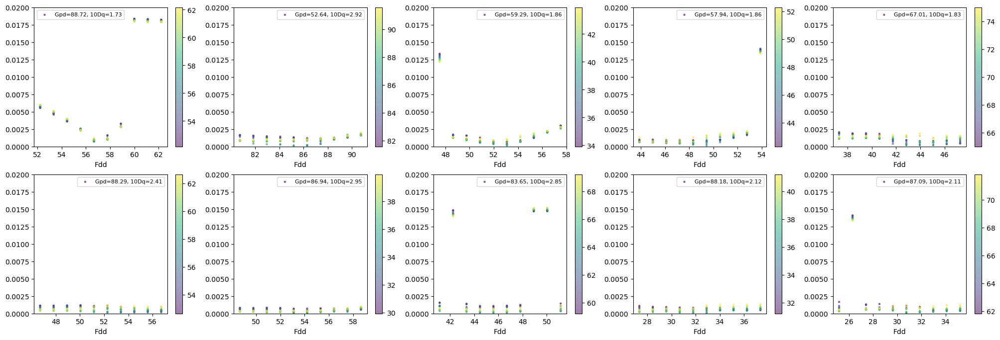

In [107]:
# Define width we want to test at
fpd_wid = 5
fdd_wid = 5
fpd_npts = 10
fdd_npts = 10


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./linio2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./linio2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        fpd_pts = x_pts[1]
        gpd = gpd_vals[i]
        tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fdd_pts, y_pts, c=fpd_pts, cmap="viridis", label=f"Gpd={gpd_vals[i]:0.2f}, 10Dq={tdq_vals[i]:0.2f}", s=5, alpha=0.5)
        axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fdd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        # cb.set_label(label="Iter", size=16)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./linio2_eval/4var_err_land/figures/{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_byfdd_cfpd_err.png")

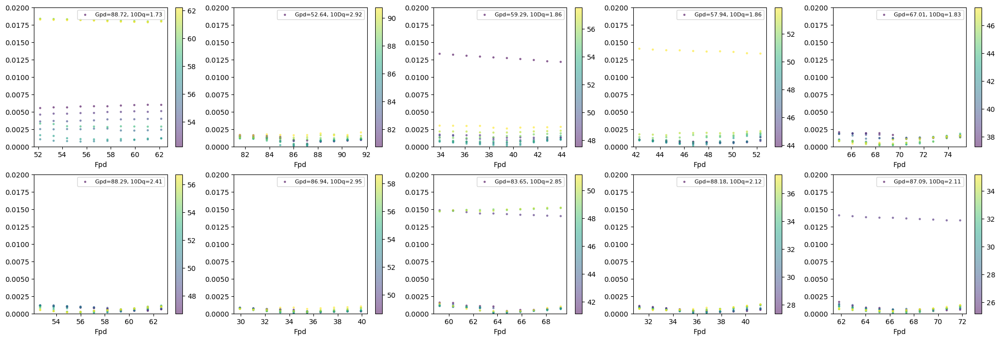

In [106]:
# Define width we want to test at
fpd_wid = 5
fdd_wid = 5
fpd_npts = 10
fdd_npts = 10


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./linio2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./linio2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        fpd_pts = x_pts[1]
        gpd = gpd_vals[i]
        tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fpd_pts, y_pts, c=fdd_pts, cmap="viridis", label=f"Gpd={gpd_vals[i]:0.2f}, 10Dq={tdq_vals[i]:0.2f}", s=5, alpha=0.5)
        axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fpd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        # cb.set_label(label="Iter", size=16)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./linio2_eval/4var_err_land/figures/{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_byfpd_cfdd_err.png")

#### Notes

**3/18/2025**
- In general, as the pairing energy threshold increases, the influence of Fdd decreases.
- Can I plot these as curves? 

## 4 Variable Error Landscape

### Read in test data

In [121]:
hs_df = pd.read_pickle("./theo_specs/ni3+_4var_lstspecs_norm.pkl")

hs_df["PE"] = hs_df["10Dq"]/hs_df["Fdd"] * 100
hs_df.sort_values(by="PE", ascending=True, inplace=True)
hs_df.reset_index(drop = True, inplace=True)
gpd_vals = hs_df["Gpd"].to_numpy(dtype="float")
fdd_vals = hs_df["Fdd"].to_numpy(dtype="float")
tdq_vals = hs_df["10Dq"].to_numpy(dtype="float")
fpd_vals = hs_df["Fpd"].to_numpy(dtype="float")

hs_df

,Fdd,10Dq,Gpd,Fpd,Spectrum,SpinState,PE
0,57.224500,1.730092,88.717048,57.164671,xData yData 0 8230.00 0.000183 ...,LS,3.023342
1,67.902285,2.253013,89.803860,84.085444,xData yData 0 8230.00 0.000181 ...,LS,3.318022
2,45.901032,1.539674,67.710113,64.760019,xData yData 0 8230.00 0.000160 ...,LS,3.354333
3,85.742699,2.916827,52.643300,86.569573,xData yData 0 8230.00 0.000151 ...,LS,3.401837
4,76.943709,2.696582,71.172486,77.076864,xData yData 0 8230.00 0.000164 ...,LS,3.504617
5,75.532149,2.659608,79.160605,82.086824,xData yData 0 8230.00 0.000171 ...,LS,3.521160
6,52.530857,1.859548,59.294917,38.918211,xData yData 0 8230.00 0.000158 ...,LS,3.539916
7,73.623100,2.726240,87.240693,41.448039,xData yData 0 8230.00 0.000173 ...,LS,3.702969
8,61.523756,2.335779,87.164169,43.806446,xData yData 0 8230.00 0.000175 ...,LS,3.796548
9,48.885070,1.860597,57.940522,47.300272,xData yData 0 8230.00 0.000156 ...,LS,3.806065


### Establish directory and filenames

In [122]:
source = "./linio2_eval/4var_err_land/"

wids = [10, 10, 10, 0.2]
npts = [20, 20, 20, 20]
labels = ["fdd", "fpd", "gpd", "tdq"]
axes = ["Fdd", "Fpd", "Gpd", "10Dq"]

### Plot Fdd, Fpd heatmaps

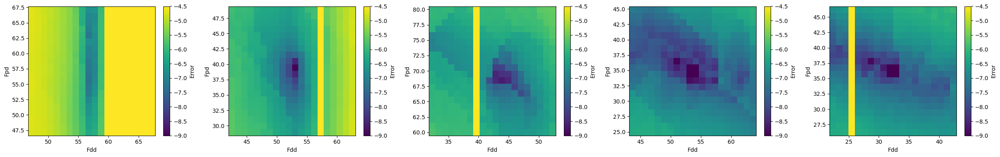

In [123]:
f = 0
s = 1


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel(axes[f])
        axs[g].set_ylabel(axes[s])
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fdd, Gpd heatmaps

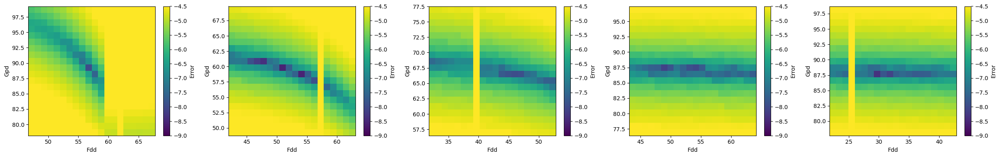

In [124]:
f = 0
s = 2


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel(axes[f])
        axs[g].set_ylabel(axes[s])
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fdd, 10Dq heatmaps

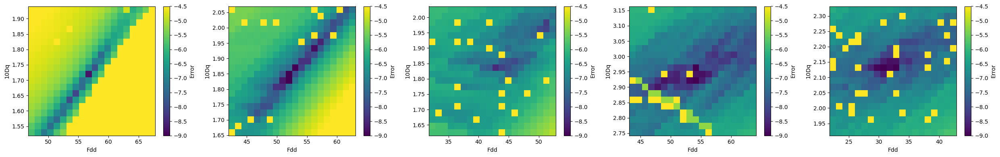

In [125]:
f = 0
s = 3


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel(axes[f])
        axs[g].set_ylabel(axes[s])
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fpd, Gpd heatmaps

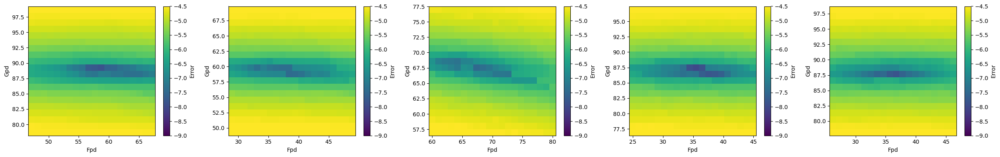

In [126]:
f = 1
s = 2


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel(axes[f])
        axs[g].set_ylabel(axes[s])
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fpd, 10Dq heatmaps

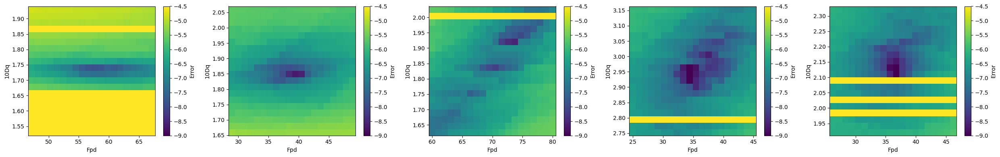

In [127]:
f = 1
s = 3


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel(axes[f])
        axs[g].set_ylabel(axes[s])
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Gpd, 10Dq heatmaps

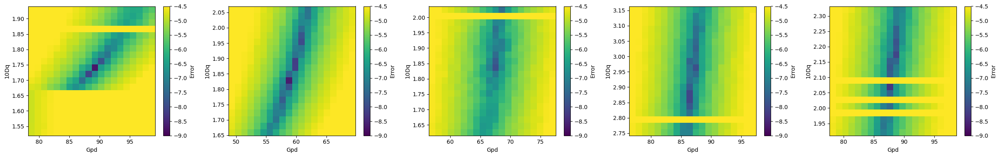

In [128]:
f = 2
s = 3


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel(axes[f])
        axs[g].set_ylabel(axes[s])
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

# Mn2+ Error Landscape

## $F_{dd}$, $10Dq$ Error Landscape

### Read in test data

In [4]:
hs_df = pd.read_pickle("Fdd_10Dq_rGpd_hsspecs.pkl")

hs_df.reset_index(drop = True, inplace=True)
gpd_vals = hs_df["Gpd"].to_numpy(dtype="float")
fdd_vals = hs_df["Fdd"].to_numpy(dtype="float")
tdq_vals = hs_df["10Dq"].to_numpy(dtype="float")

hs_df

,Fdd,10Dq,Gpd,Spectrum,SpinState
0,60,1.25,82.739234,xData yData 0 6460.0 0.002011 1 ...,HS
1,65,1.25,75.395734,xData yData 0 6460.0 0.001908 1 ...,HS
2,70,1.25,70.819470,xData yData 0 6460.0 0.001847 1 ...,HS
3,75,1.25,70.330553,xData yData 0 6460.0 0.001839 1 ...,HS
4,80,1.25,86.265405,xData yData 0 6460.0 0.002069 1 ...,HS
5,85,1.25,88.255112,xData yData 0 6460.0 0.002101 1 ...,HS
6,90,1.25,82.132716,xData yData 0 6460.0 0.001996 1 ...,HS
7,95,1.25,84.589931,xData yData 0 6460.0 0.002038 1 ...,HS
8,100,1.25,80.872500,xData yData 0 6460.0 0.001982 1 ...,HS
9,60,1.50,88.701448,xData yData 0 6460.0 0.002113 1 ...,HS


### Plot landscape by 10Dq value

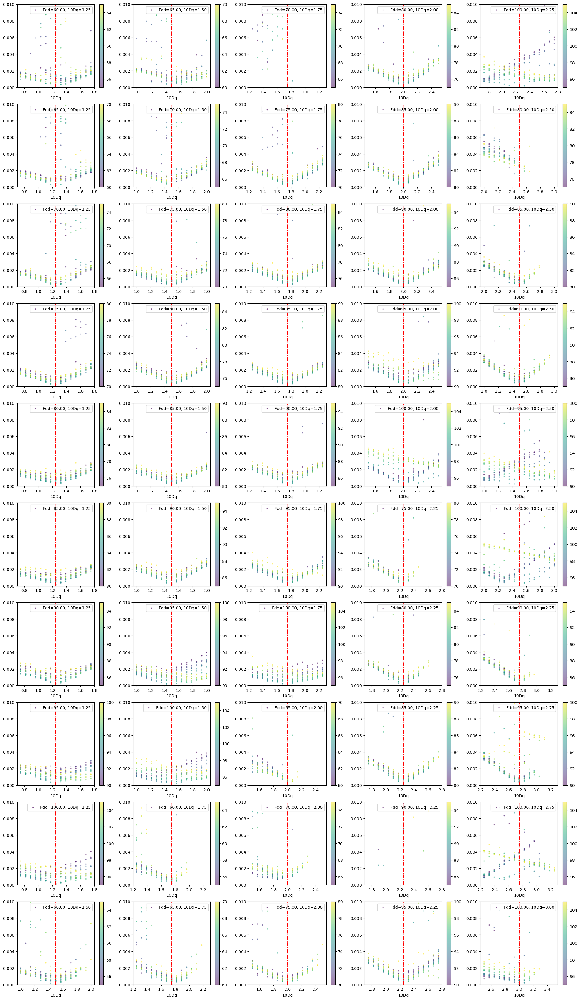

In [5]:
# Define number of calls and relevant spectra
n_calls = 225

# Define width we want to test at
tdq_wid = .5
fdd_wid = 5
tdq_range = 15
fdd_range = 15

# Define plotting parameters
fig, axs = plt.subplots(10, 5, figsize=(25, 44))

n = 25
iters = np.arange(0, 10)

on_pts = 0
off_pts = 0

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./hs_3var_err_land/bo_3p_{n_calls}i_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_vals[i]}_{fdd_wid}_{tdq_wid}_x.npy"
    file = Path(fname)
    # print(fname)
    if file.exists():

        x_pts = np.squeeze(np.load(fname))
        y_pts = np.squeeze(np.load(f"./hs_3var_err_land/bo_3p_{n_calls}i_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_vals[i]}_{fdd_wid}_{tdq_wid}_y.npy"))
        gpd_pts = x_pts[0]
        fdd_pts = x_pts[1]
        tdq_pts = x_pts[2]
    
        # Plot iterations
        c = int(g / 10)
        r = int(g % 10)
        mp = axs[r, c].scatter(tdq_pts, y_pts, c=fdd_pts, cmap="viridis", label=f"Fdd={fdd_vals[i]:0.2f}, 10Dq={tdq_vals[i]:0.2f}", s=5, alpha=0.5)
        axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("10Dq")
        cb = fig.colorbar(mp, ax=axs[r, c])
        # cb.set_label(label="Iter", size=16)

        sol_y = np.linspace(0, 0.02, 100)
        sol_x = np.full_like(sol_y, tdq_vals[i])
        axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

plt.show()
# print(on_pts/(on_pts+off_pts))
# plt.savefig(f"./figures/hs_spec/hs_spec_tdqerr_{n_calls}i_stdxi.png")

### Plot landscape by Fdd value

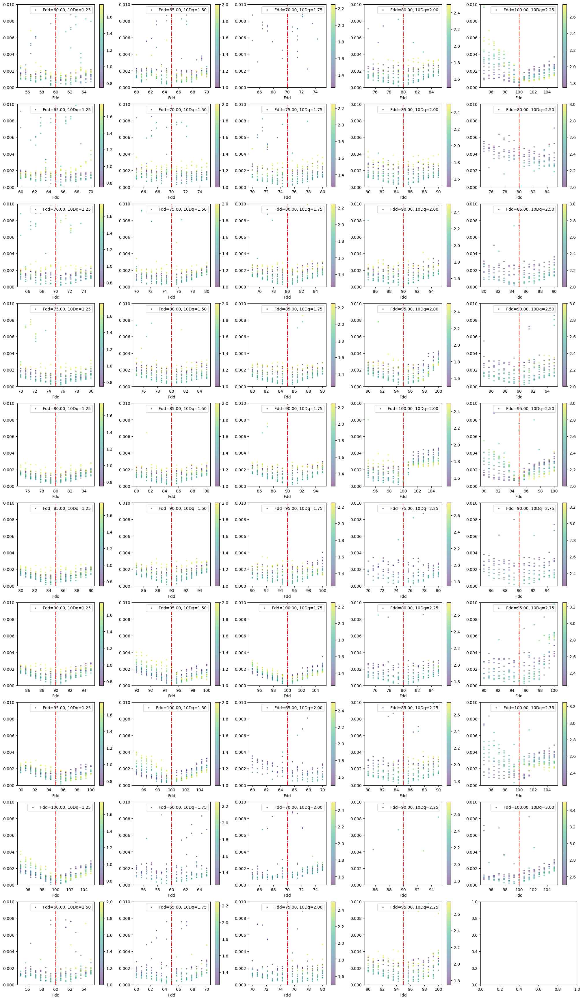

In [8]:
# Define number of calls and relevant spectra
n_calls = 225

# Define width we want to test at
tdq_wid = .5
fdd_wid = 5
tdq_range = 15
fdd_range = 15

# Define plotting parameters
fig, axs = plt.subplots(10, 5, figsize=(25, 44))

n = 25
iters = np.arange(0, 10)

on_pts = 0
off_pts = 0

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./hs_3var_err_land/bo_3p_{n_calls}i_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_vals[i]}_{fdd_wid}_{tdq_wid}_x.npy"
    file = Path(fname)
    # print(fname)
    if file.exists():

        x_pts = np.squeeze(np.load(fname))
        y_pts = np.squeeze(np.load(f"./hs_3var_err_land/bo_3p_{n_calls}i_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_vals[i]}_{fdd_wid}_{tdq_wid}_y.npy"))
        gpd_pts = x_pts[0]
        fdd_pts = x_pts[1]
        tdq_pts = x_pts[2]
    
        # Plot iterations
        c = int(g / 10)
        r = int(g % 10)
        mp = axs[r, c].scatter(fdd_pts, y_pts, c=tdq_pts, cmap="viridis", label=f"Fdd={fdd_vals[i]:0.2f}, 10Dq={tdq_vals[i]:0.2f}", s=5, alpha=0.5)
        axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fdd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        # cb.set_label(label="Iter", size=16)

        sol_y = np.linspace(0, 0.02, 100)
        sol_x = np.full_like(sol_y, fdd_vals[i])
        axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

plt.show()
# print(on_pts/(on_pts+off_pts))
# plt.savefig(f"./figures/hs_spec/hs_spec_tdqerr_{n_calls}i_stdxi.png")

## 4 Variable Error Landscape

### Read in test data

In [82]:
hs_df = pd.read_pickle("./theo_specs/mn2+_4var_hstspecs_norm.pkl")

hs_df["PE"] = hs_df["10Dq"]/hs_df["Fdd"] * 100
hs_df.sort_values(by="PE", ascending=True, inplace=True)
hs_df.reset_index(drop = True, inplace=True)
gpd_vals = hs_df["Gpd"].to_numpy(dtype="float")
fdd_vals = hs_df["Fdd"].to_numpy(dtype="float")
tdq_vals = hs_df["10Dq"].to_numpy(dtype="float")
fpd_vals = hs_df["Fpd"].to_numpy(dtype="float")

hs_df

,Fdd,10Dq,Gpd,Fpd,Spectrum,SpinState,PE
0,78.191271,0.024886,87.096957,34.178139,xData yData 0 6460.0 0.000082 1 ...,HS,0.031828
1,99.804696,0.107667,78.445715,96.993847,xData yData 0 6460.0 0.000078 1 ...,HS,0.107878
2,55.045664,0.148660,82.894953,81.273369,xData yData 0 6460.0 0.000081 1 ...,HS,0.270067
3,92.264148,0.317043,88.905153,57.784027,xData yData 0 6460.0 0.000083 1 ...,HS,0.343625
4,68.053749,0.311387,64.604407,64.912061,xData yData 0 6460.0 0.000072 1 ...,HS,0.457560
5,75.303266,0.363684,81.431428,35.608592,xData yData 0 6460.0 0.000079 1 ...,HS,0.482959
6,39.456755,0.196575,50.588252,25.031640,xData yData 0 6460.0 0.000067 1 ...,HS,0.498204
7,93.892890,0.604189,76.879795,33.364234,xData yData 0 6460.0 0.000076 1 ...,HS,0.643488
8,81.064759,0.564674,87.684524,92.820461,xData yData 0 6460.0 0.000083 1 ...,HS,0.696571
9,86.928917,0.647161,61.947845,77.169483,xData yData 0 6460.0 0.000070 1 ...,HS,0.744472


### Plot Fdd, Fpd Landscape by Fdd value

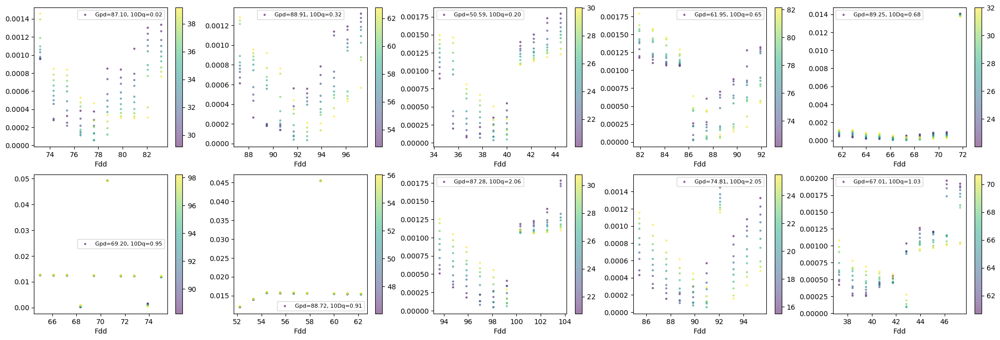

In [113]:
# Define width we want to test at
fpd_wid = 5
fdd_wid = 5
fpd_npts = 10
fdd_npts = 10


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        fpd_pts = x_pts[1]
        gpd = gpd_vals[i]
        tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fdd_pts, y_pts, c=fpd_pts, cmap="viridis", label=f"Gpd={gpd_vals[i]:0.2f}, 10Dq={tdq_vals[i]:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fdd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        # cb.set_label(label="Iter", size=16)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./mno_eval/4var_err_land/figures/{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_byfdd_cfpd_err.png")

### Plot Fdd, Fpd Landscape by Fpd value

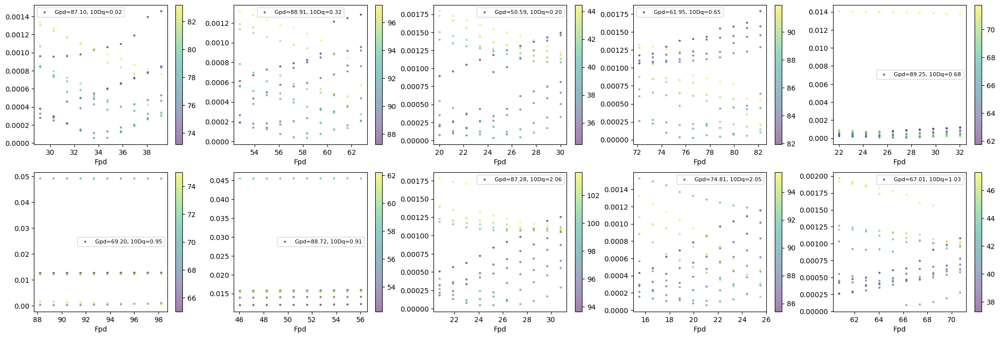

In [115]:
# Define width we want to test at
fpd_wid = 5
fdd_wid = 5
fpd_npts = 10
fdd_npts = 10


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        fpd_pts = x_pts[1]
        gpd = gpd_vals[i]
        tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fpd_pts, y_pts, c=fdd_pts, cmap="viridis", label=f"Gpd={gpd_vals[i]:0.2f}, 10Dq={tdq_vals[i]:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fpd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        # cb.set_label(label="Iter", size=16)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./mno_eval/4var_err_land/figures/{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_byfpd_cfdd_err.png")

### Plot Fdd, Gpd Landscape by Gpd value

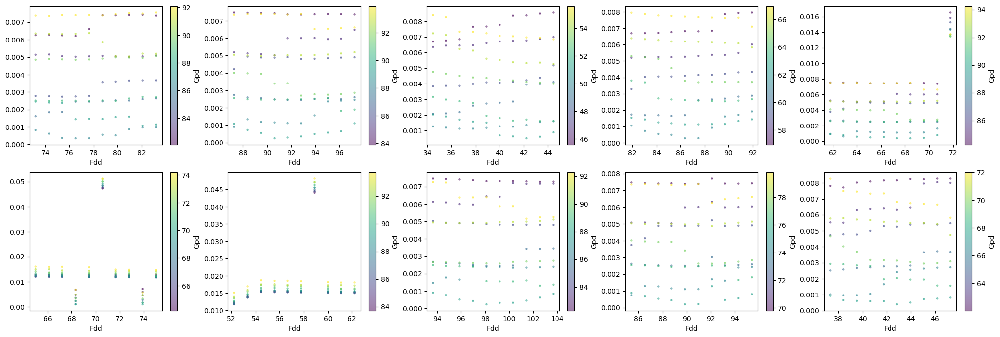

In [118]:
# Define width we want to test at
gpd_wid = 5
fdd_wid = 5
gpd_npts = 10
fdd_npts = 10


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{gpd_wid}gpd_{gpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{gpd_wid}gpd_{gpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        gpd_pts = x_pts[2]
        fpd = fpd_vals[i]
        tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fdd_pts, y_pts, c=gpd_pts, cmap="viridis", label=f"Fpd={fpd:0.2f}, 10Dq={tdq:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fdd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Gpd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./mno_eval/4var_err_land/figures/{fdd_wid}fdd_{fdd_npts}pts_{gpd_wid}gpd_{gpd_npts}pts_byfdd_cgpd_err.png")

### Plot Fdd, Gpd Landscape by Gpd value

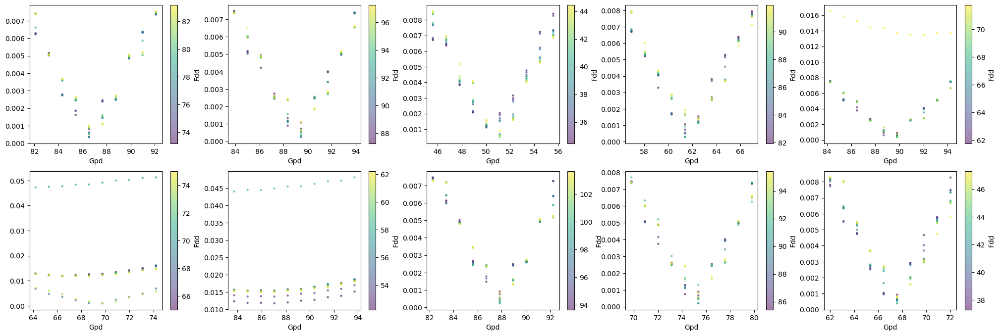

In [120]:
# Define width we want to test at
gpd_wid = 5
fdd_wid = 5
gpd_npts = 10
fdd_npts = 10


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{gpd_wid}gpd_{gpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{gpd_wid}gpd_{gpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        gpd_pts = x_pts[2]
        fpd = fpd_vals[i]
        tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(gpd_pts, y_pts, c=fdd_pts, cmap="viridis", label=f"Fpd={fpd:0.2f}, 10Dq={tdq:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Gpd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Fdd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./mno_eval/4var_err_land/figures/{fdd_wid}fdd_{fdd_npts}pts_{gpd_wid}gpd_{gpd_npts}pts_bygpd_cfdd_err.png")

### Plot Fdd, 10Dq Landscape by Fdd value

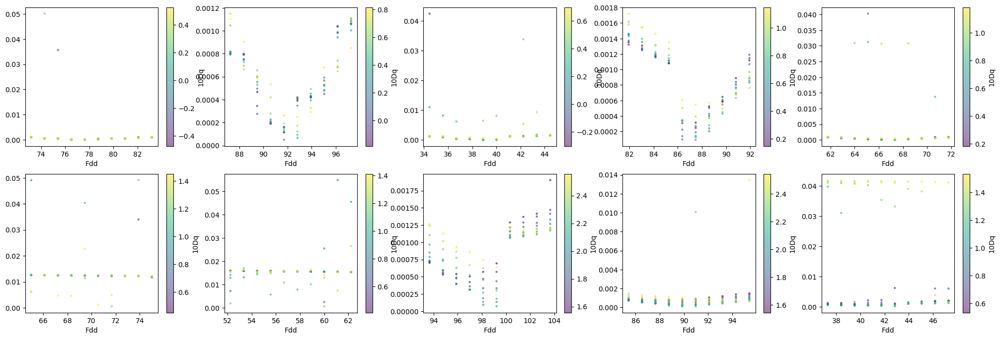

In [121]:
# Define width we want to test at
var1_wid = 5
var2_wid = .5
var1_npts = 10
var2_npts = 10


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fdd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fdd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        tdq_pts = x_pts[3]
        gpd = gpd_vals[i]
        fpd = fpd_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fdd_pts, y_pts, c=tdq_pts, cmap="viridis", label=f"Fpd={fpd:0.2f}, Gpd={gpd:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fdd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="10Dq", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./mno_eval/4var_err_land/figures/{var1_wid}fdd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_byfdd_ctdq_err.png")

### Plot Fdd, 10Dq Landscape by 10Dq value

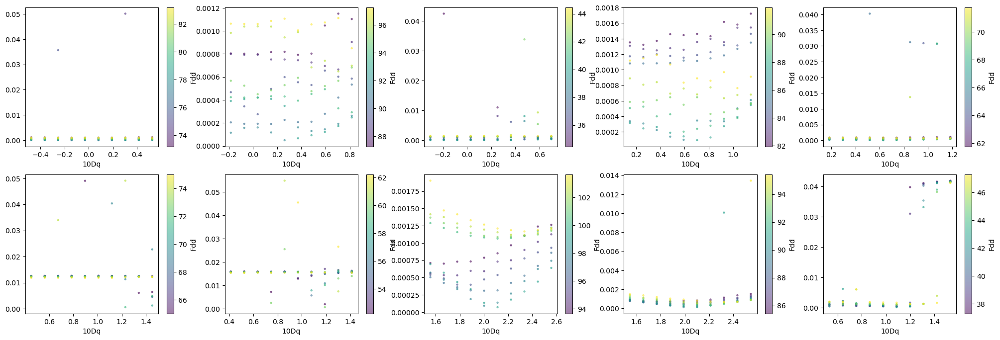

In [122]:
# Define width we want to test at
var1_wid = 5
var2_wid = .5
var1_npts = 10
var2_npts = 10


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fdd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fdd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        tdq_pts = x_pts[3]
        gpd = gpd_vals[i]
        fpd = fpd_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(tdq_pts, y_pts, c=fdd_pts, cmap="viridis", label=f"Fpd={fpd:0.2f}, Gpd={gpd:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("10Dq")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Fdd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./mno_eval/4var_err_land/figures/{var1_wid}fdd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_bytdq_cfdd_err.png")

### Plot Fpd, Gpd Landscape by Fpd value

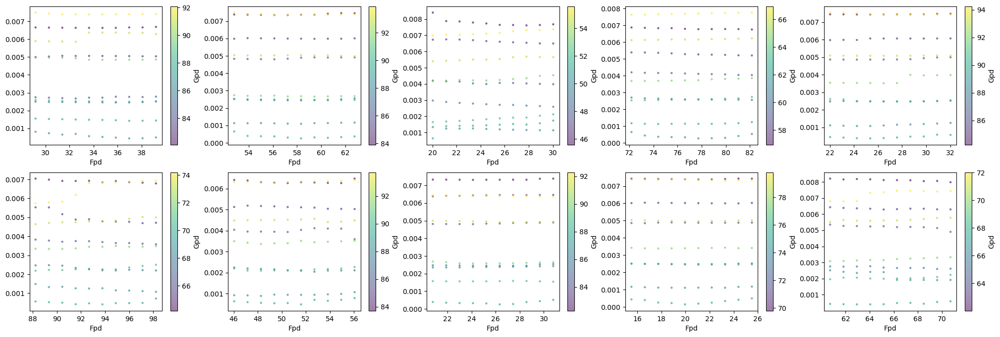

In [123]:
# Define width we want to test at
var1_wid = 5
var2_wid = 5
var1_npts = 10
var2_npts = 10


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}gpd_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}gpd_{var2_npts}pts_err_pts.npy")
        fpd_pts = x_pts[1]
        gpd_pts = x_pts[2]
        fdd = fdd_vals[i]
        tdq = tdq_vals[i]

        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fpd_pts, y_pts, c=gpd_pts, cmap="viridis", label=f"Fdd={fdd:0.2f}, 10Dq={tdq:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fpd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Gpd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./mno_eval/4var_err_land/figures/{var1_wid}fpd_{var1_npts}pts_{var2_wid}gpd_{var2_npts}pts_byfpd_cgpd_err.png")

### Plot Fpd, Gpd Landscape by Gpd value

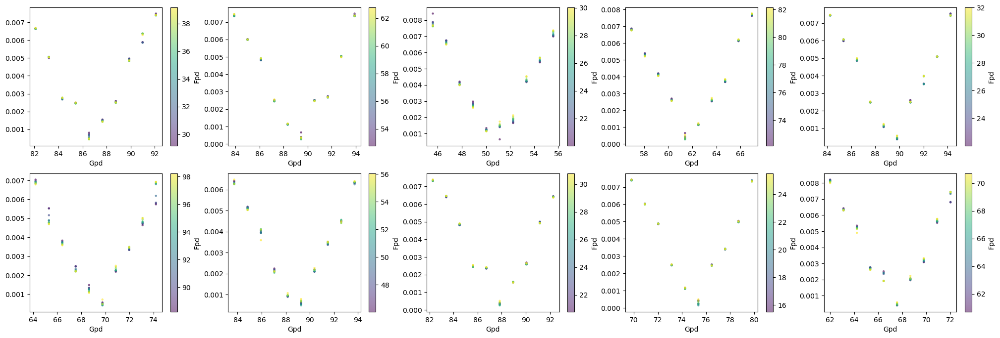

In [124]:
# Define width we want to test at
var1_wid = 5
var2_wid = 5
var1_npts = 10
var2_npts = 10


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}gpd_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}gpd_{var2_npts}pts_err_pts.npy")
        fpd_pts = x_pts[1]
        gpd_pts = x_pts[2]
        fdd = fdd_vals[i]
        tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(gpd_pts, y_pts, c=fpd_pts, cmap="viridis", label=f"Fdd={fdd:0.2f}, 10Dq={tdq:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Gpd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Fpd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./mno_eval/4var_err_land/figures/{var1_wid}fpd_{var1_npts}pts_{var2_wid}gpd_{var2_npts}pts_bygpd_cfpd_err.png")

### Plot Fpd, 10Dq Landscape by Fpd value

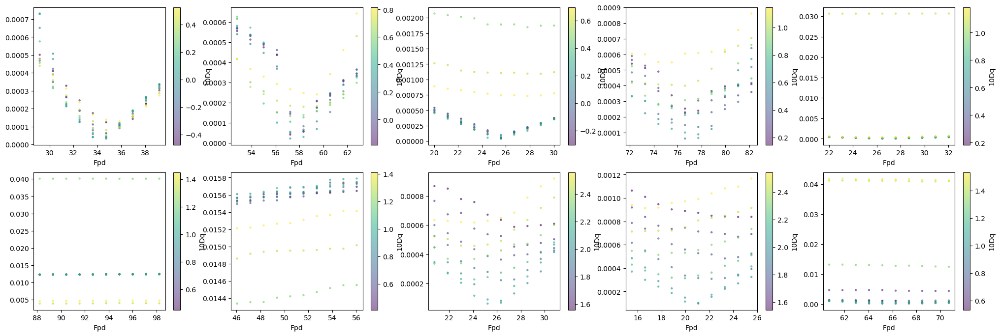

In [125]:
# Define width we want to test at
var1_wid = 5
var2_wid = .5
var1_npts = 10
var2_npts = 10


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_err_pts.npy")
        fpd_pts = x_pts[1]
        tdq_pts = x_pts[3]
        fdd = fdd_vals[i]
        gpd = gpd_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fpd_pts, y_pts, c=tdq_pts, cmap="viridis", label=f"Fdd={fdd:0.2f}, Gpd={gpd:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fpd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="10Dq", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./mno_eval/4var_err_land/figures/{var1_wid}fpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_byfpd_ctdq_err.png")

### Plot Fpd, 10Dq Landscape by 10Dq value

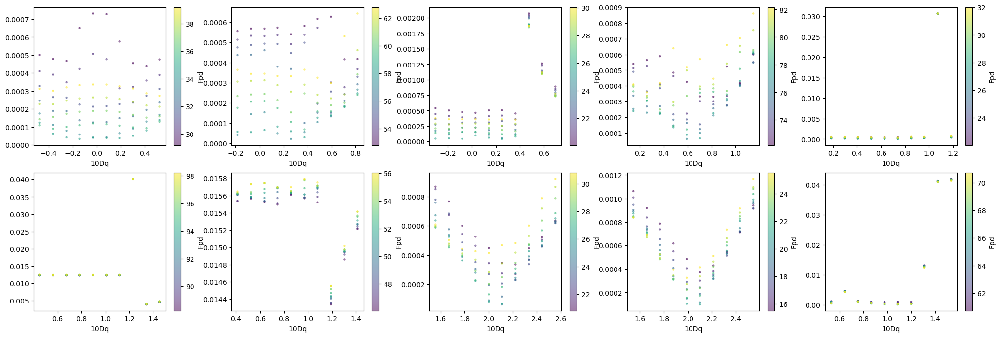

In [126]:
# Define width we want to test at
var1_wid = 5
var2_wid = .5
var1_npts = 10
var2_npts = 10


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_err_pts.npy")
        fpd_pts = x_pts[1]
        tdq_pts = x_pts[3]
        fdd = fdd_vals[i]
        gpd = gpd_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(tdq_pts, y_pts, c=fpd_pts, cmap="viridis", label=f"Fdd={fdd:0.2f}, Gpd={gpd:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("10Dq")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Fpd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=10)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./mno_eval/4var_err_land/figures/{var1_wid}fpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_bytdq_cfpd_err.png")

### Plot Gpd, 10Dq Landscape by Gpd value

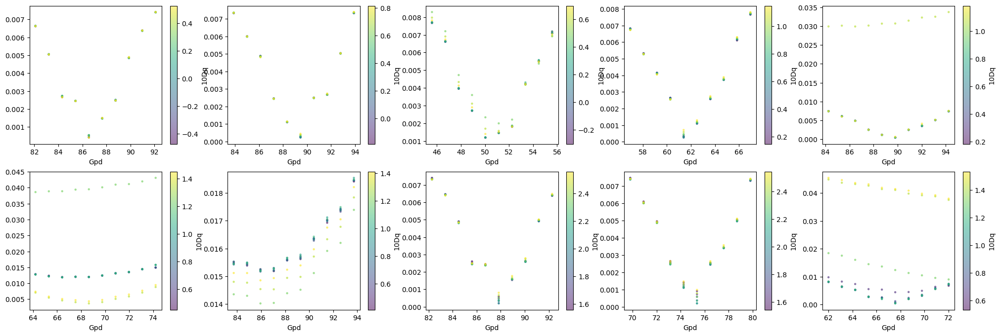

In [127]:
# Define width we want to test at
var1_wid = 5
var2_wid = .5
var1_npts = 10
var2_npts = 10


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}gpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}gpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_err_pts.npy")
        gpd_pts = x_pts[2]
        tdq_pts = x_pts[3]
        fdd = fdd_vals[i]
        fpd = fpd_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(gpd_pts, y_pts, c=tdq_pts, cmap="viridis", label=f"Fdd={fdd:0.2f}, Fpd={fpd:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Gpd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="10Dq", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./mno_eval/4var_err_land/figures/{var1_wid}gpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_bygpd_ctdq_err.png")

### Plot Gpd, 10Dq Landscape by 10Dq value

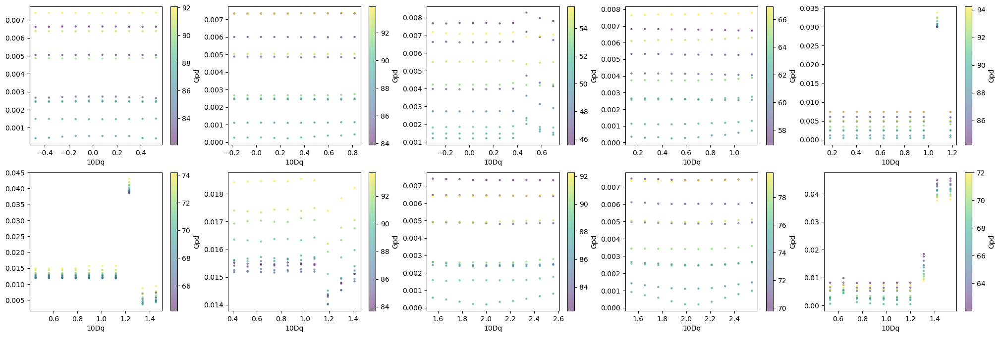

In [128]:
# Define width we want to test at
var1_wid = 5
var2_wid = .5
var1_npts = 10
var2_npts = 10


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}gpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}gpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_err_pts.npy")
        gpd_pts = x_pts[2]
        tdq_pts = x_pts[3]
        fdd = fdd_vals[i]
        fpd = fpd_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(tdq_pts, y_pts, c=gpd_pts, cmap="viridis", label=f"Fdd={fdd:0.2f}, Fpd={fpd:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("10Dq")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Gpd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=10)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./mno_eval/4var_err_land/figures/{var1_wid}gpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_bytdq_cgpd_err.png")

### Plot Fdd, Fpd heatmaps

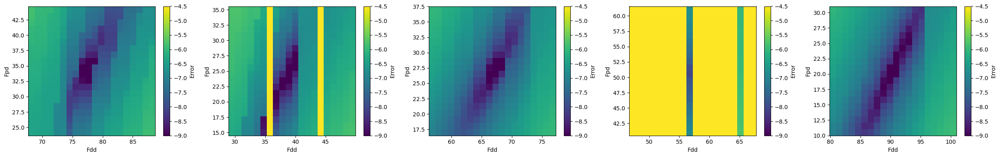

In [84]:
# Define width we want to test at
fpd_wid = 10
fdd_wid = 10
fpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        fpd_pts = x_pts[1]
        # gpd = gpd_vals[i]
        # tdq = tdq_vals[i]

        mp = axs[g].pcolormesh(fdd_pts, fpd_pts, np.log(y_pts), cmap="viridis",  vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel("Fdd")
        axs[g].set_ylabel("Fpd")
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./mno_eval/4var_err_land/figures/hmap_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts.png")

### Plot Fdd, Gpd heatmaps

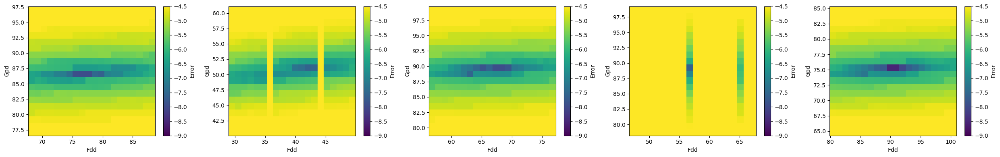

In [83]:
# Define width we want to test at
fpd_wid = 10
fdd_wid = 10
fpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}gpd_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}gpd_{fpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        gpd_pts = x_pts[2]
        # gpd = gpd_vals[i]
        # tdq = tdq_vals[i]

        mp = axs[g].pcolormesh(fdd_pts, gpd_pts, np.log(y_pts), cmap="viridis",  vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel("Fdd")
        axs[g].set_ylabel("Gpd")
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./mno_eval/4var_err_land/figures/hmap_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}gpd_{fpd_npts}pts.png")

### Plot Fdd, 10Dq heatmaps

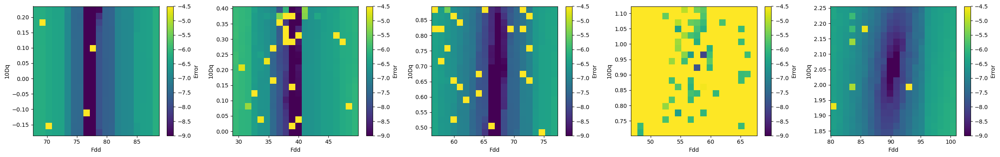

In [85]:
# Define width we want to test at
fpd_wid = .2
fdd_wid = 10
fpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        tdq_pts = x_pts[3]
        # gpd = gpd_vals[i]
        # tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        mp = axs[g].pcolormesh(fdd_pts, tdq_pts, np.log(y_pts), cmap="viridis",  vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel("Fdd")
        axs[g].set_ylabel("10Dq")
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./mno_eval/4var_err_land/figures/hmap_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts.png")

### Plot Fpd, Gpd heatmaps

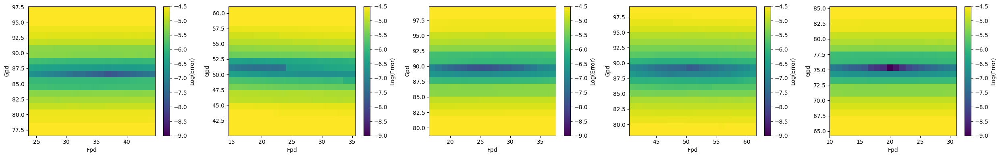

In [86]:
# Define width we want to test at
fpd_wid = 10
fdd_wid = 10
fpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fpd_{fdd_npts}pts_{fpd_wid}gpd_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fpd_{fdd_npts}pts_{fpd_wid}gpd_{fpd_npts}pts_err_pts.npy")
        fpd_pts = x_pts[1]
        gpd_pts = x_pts[2]
        # gpd = gpd_vals[i]
        # tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        mp = axs[g].pcolormesh(fpd_pts, gpd_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel("Fpd")
        axs[g].set_ylabel("Gpd")
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Log(Error)", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./mno_eval/4var_err_land/figures/hmap_{fdd_wid}fpd_{fdd_npts}pts_{fpd_wid}gpd_{fpd_npts}pts.png")

### Plot Fpd, 10Dq heatmaps

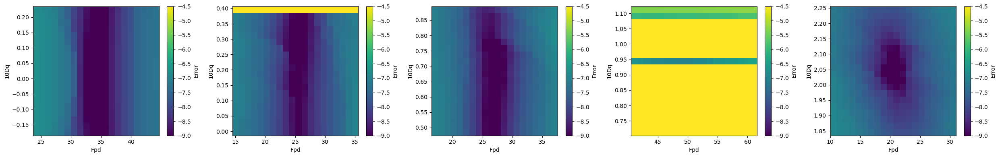

In [87]:
# Define width we want to test at
fpd_wid = .2
fdd_wid = 10
fpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fpd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fpd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts_err_pts.npy")
        fpd_pts = x_pts[1]
        tdq_pts = x_pts[3]
        # gpd = gpd_vals[i]
        # tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        mp = axs[g].pcolormesh(fpd_pts, tdq_pts, np.log(y_pts), cmap="viridis",  vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel("Fpd")
        axs[g].set_ylabel("10Dq")
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./mno_eval/4var_err_land/figures/hmap_{fdd_wid}fpd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts.png")

### Plot Gpd, 10Dq heatmaps

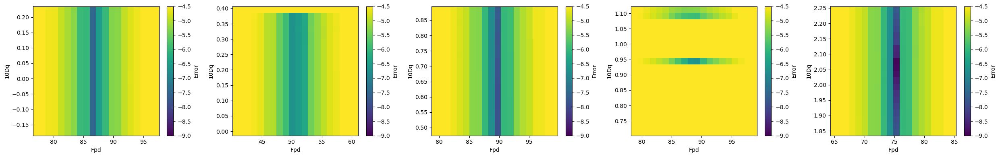

In [88]:
# Define width we want to test at
fpd_wid = .2
fdd_wid = 10
fpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}gpd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./mno_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}gpd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts_err_pts.npy")
        gpd_pts = x_pts[2]
        tdq_pts = x_pts[3]
        # gpd = gpd_vals[i]
        # tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        mp = axs[g].pcolormesh(gpd_pts, tdq_pts, np.log(y_pts), cmap="viridis",  vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel("Fpd")
        axs[g].set_ylabel("10Dq")
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./mno_eval/4var_err_land/figures/hmap_{fdd_wid}gpd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts.png")

# Mn3+ Error Landscape

## 4 Variable Error Landscapes

### Read in test data

In [112]:
hs_df = pd.read_pickle("./theo_specs/mn3+_4var_hstspecs_norm.pkl")

hs_df["PE"] = hs_df["10Dq"]/hs_df["Fdd"] * 100
hs_df.sort_values(by="PE", ascending=True, inplace=True)
hs_df.reset_index(drop = True, inplace=True)
gpd_vals = hs_df["Gpd"].to_numpy(dtype="float")
fdd_vals = hs_df["Fdd"].to_numpy(dtype="float")
tdq_vals = hs_df["10Dq"].to_numpy(dtype="float")
fpd_vals = hs_df["Fpd"].to_numpy(dtype="float")

hs_df

,Fdd,10Dq,Gpd,Fpd,Spectrum,SpinState,PE
0,78.191271,0.024886,86.371196,34.178139,xData yData 0 6460.0 0.000110 1 ...,HS,0.031828
1,99.804696,0.107667,75.557144,96.993847,xData yData 0 6460.0 0.000097 1 ...,HS,0.107878
2,55.045664,0.148660,81.118691,81.273369,xData yData 0 6460.0 0.000101 1 ...,HS,0.270067
3,92.264148,0.317043,88.631441,57.784027,xData yData 0 6460.0 0.000111 1 ...,HS,0.343625
4,68.053749,0.311387,58.255508,64.912061,xData yData 0 6460.0 0.000085 1 ...,HS,0.457560
5,75.303266,0.363684,79.289285,35.608592,xData yData 0 6460.0 0.000100 1 ...,HS,0.482959
6,39.456755,0.196575,40.735315,25.031640,xData yData 0 6460.0 0.000078 1 ...,HS,0.498204
7,93.892890,0.604189,73.599744,33.364234,xData yData 0 6460.0 0.000096 1 ...,HS,0.643488
8,81.064759,0.564674,87.105656,92.820461,xData yData 0 6460.0 0.000107 1 ...,HS,0.696571
9,86.928917,0.647161,54.934807,77.169483,xData yData 0 6460.0 0.000083 1 ...,HS,0.744472


### Establish directory and filenames

In [114]:
source = "./mn2o3_eval/4var_err_land/"

wids = [10, 10, 10, 0.2]
npts = [20, 20, 20, 20]
labels = ["fdd", "fpd", "gpd", "tdq"]
axes = ["Fdd", "Fpd", "Gpd", "10Dq"]

### Plot Fdd, Fpd heatmaps

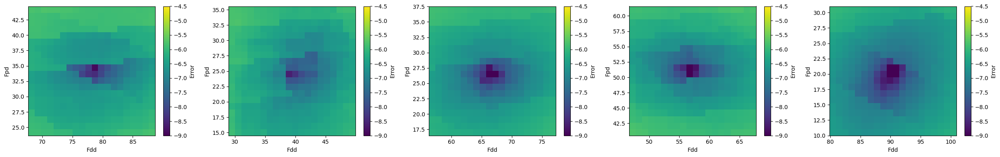

In [115]:
f = 0
s = 1


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel(axes[f])
        axs[g].set_ylabel(axes[s])
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fdd, Gpd heatmaps

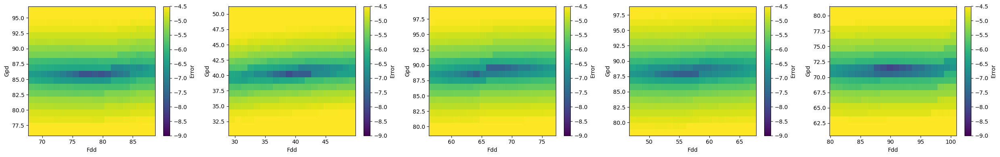

In [116]:
f = 0
s = 2


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel(axes[f])
        axs[g].set_ylabel(axes[s])
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fdd, 10Dq heatmaps

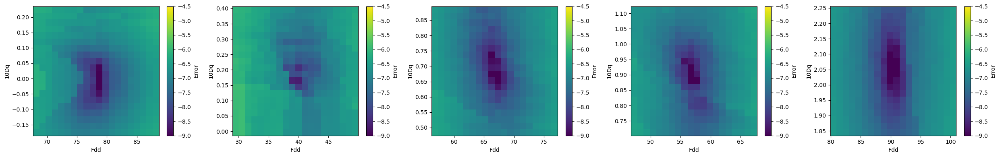

In [117]:
f = 0
s = 3


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel(axes[f])
        axs[g].set_ylabel(axes[s])
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fpd, Gpd heatmaps

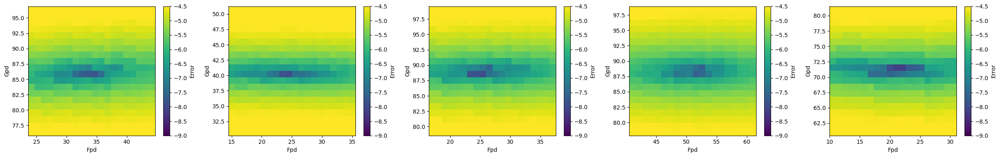

In [118]:
f = 1
s = 2


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel(axes[f])
        axs[g].set_ylabel(axes[s])
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fpd, 10Dq heatmaps

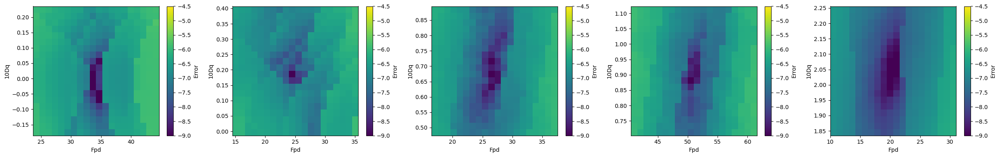

In [119]:
f = 1
s = 3


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel(axes[f])
        axs[g].set_ylabel(axes[s])
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Gpd, 10Dq heatmaps

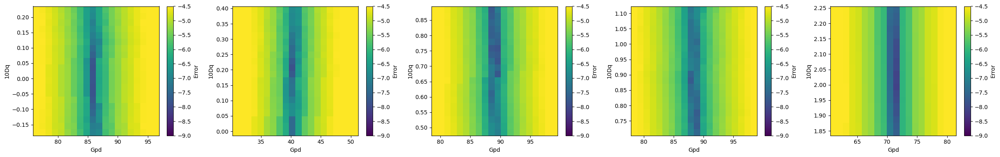

In [120]:
f = 2
s = 3


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel(axes[f])
        axs[g].set_ylabel(axes[s])
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

# Co2+ Error Landscape

## 4 Variable Error Landscapes

### Read in test data

In [7]:
hs_df = pd.read_pickle("./theo_specs/co2+_4var_hstspecs_norm.pkl")

hs_df["PE"] = hs_df["10Dq"]/hs_df["Fdd"] * 100
hs_df.sort_values(by="PE", ascending=True, inplace=True)
hs_df.reset_index(drop = True, inplace=True)
gpd_vals = hs_df["Gpd"].to_numpy(dtype="float")
fdd_vals = hs_df["Fdd"].to_numpy(dtype="float")
tdq_vals = hs_df["10Dq"].to_numpy(dtype="float")
fpd_vals = hs_df["Fpd"].to_numpy(dtype="float")

hs_df

,Fdd,10Dq,Gpd,Fpd,Spectrum,SpinState,PE
0,78.191271,-0.480091,87.096957,42.405872,xData yData 0 7620.0 0.000110 1 ...,HS,-0.613995
1,99.804696,-0.413866,78.445715,97.369617,xData yData 0 7620.0 0.000096 1 ...,HS,-0.414676
2,68.053749,-0.250891,64.604407,69.298054,xData yData 0 7620.0 0.000091 1 ...,HS,-0.368665
3,75.303266,-0.209053,81.431428,43.657518,xData yData 0 7620.0 0.000108 1 ...,HS,-0.277615
4,81.064759,-0.048261,87.684524,93.717904,xData yData 0 7620.0 0.000111 1 ...,HS,-0.059534
5,93.892890,-0.016649,76.879795,41.693705,xData yData 0 7620.0 0.000106 1 ...,HS,-0.017731
6,86.928917,0.017729,61.947845,80.023298,xData yData 0 7620.0 0.000087 1 ...,HS,0.020395
7,95.455070,0.076662,54.219811,70.483514,xData yData 0 7620.0 0.000082 1 ...,HS,0.080312
8,81.075881,0.076842,69.995833,98.735989,xData yData 0 7620.0 0.000089 1 ...,HS,0.094778
9,74.587318,0.188620,66.182074,90.249099,xData yData 0 7620.0 0.000087 1 ...,HS,0.252885


### Establish directory and filenames

In [8]:
source = "./coo_eval/4var_err_land/"

wids = [10, 10, 10, 0.2]
npts = [20, 20, 20, 20]
labels = ["fdd", "fpd", "gpd", "tdq"]
axes = ["Fdd", "Fpd", "Gpd", "10Dq"]

### Plot Fdd, Fpd heatmaps

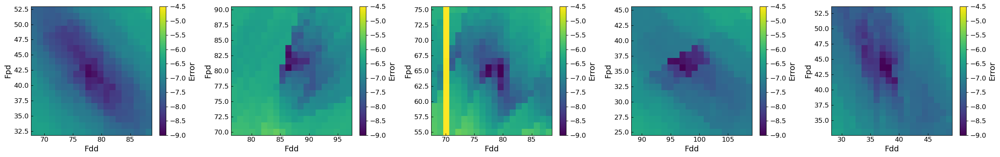

In [7]:
f = 0
s = 1


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].tick_params(direction="in", labelsize=12)
        axs[g].set_xlabel(axes[f], fontsize=14)
        axs[g].set_ylabel(axes[s], fontsize=14)
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=14)
        cb.ax.tick_params(labelsize=12)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fdd, Gpd heatmaps

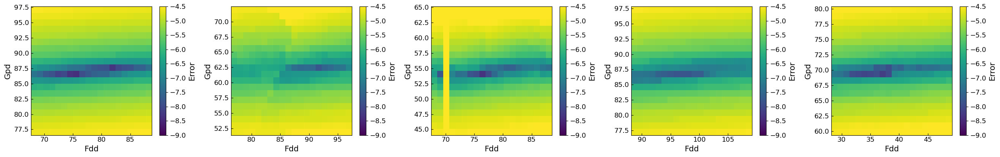

In [8]:
f = 0
s = 2


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        axs[g].tick_params(direction="in", labelsize=12)
        axs[g].set_xlabel(axes[f], fontsize=14)
        axs[g].set_ylabel(axes[s], fontsize=14)
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=14)
        cb.ax.tick_params(labelsize=12)


        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fdd, 10Dq heatmaps

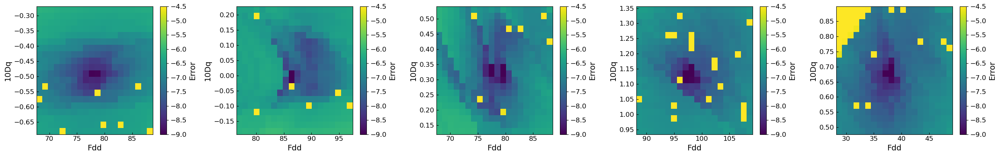

In [9]:
f = 0
s = 3


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        axs[g].tick_params(direction="in", labelsize=12)
        axs[g].set_xlabel(axes[f], fontsize=14)
        axs[g].set_ylabel(axes[s], fontsize=14)
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=14)
        cb.ax.tick_params(labelsize=12)


        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fpd, Gpd heatmaps

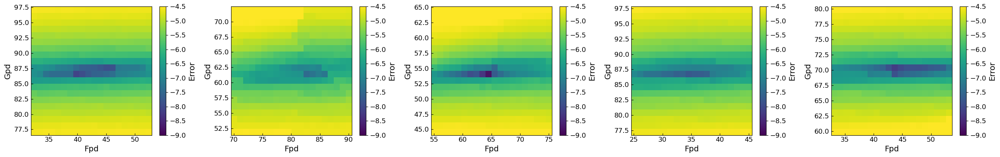

In [10]:
f = 1
s = 2


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        axs[g].tick_params(direction="in", labelsize=12)
        axs[g].set_xlabel(axes[f], fontsize=14)
        axs[g].set_ylabel(axes[s], fontsize=14)
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=14)
        cb.ax.tick_params(labelsize=12)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fpd, 10Dq heatmaps

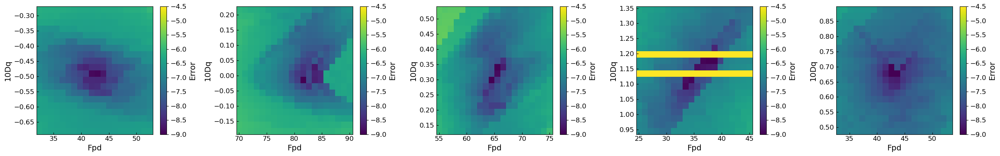

In [11]:
f = 1
s = 3


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        axs[g].tick_params(direction="in", labelsize=12)
        axs[g].set_xlabel(axes[f], fontsize=14)
        axs[g].set_ylabel(axes[s], fontsize=14)
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=14)
        cb.ax.tick_params(labelsize=12)


        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Gpd, 10Dq heatmaps

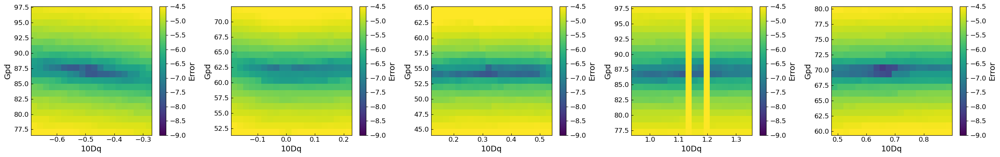

In [16]:
# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
    f = 2
    s = 3

# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        f = 3
        s = 2
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        axs[g].tick_params(direction="in", labelsize=12)
        axs[g].set_xlabel(axes[f], fontsize=14)
        axs[g].set_ylabel(axes[s], fontsize=14)
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=14)
        cb.ax.tick_params(labelsize=12)


        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot paper figures

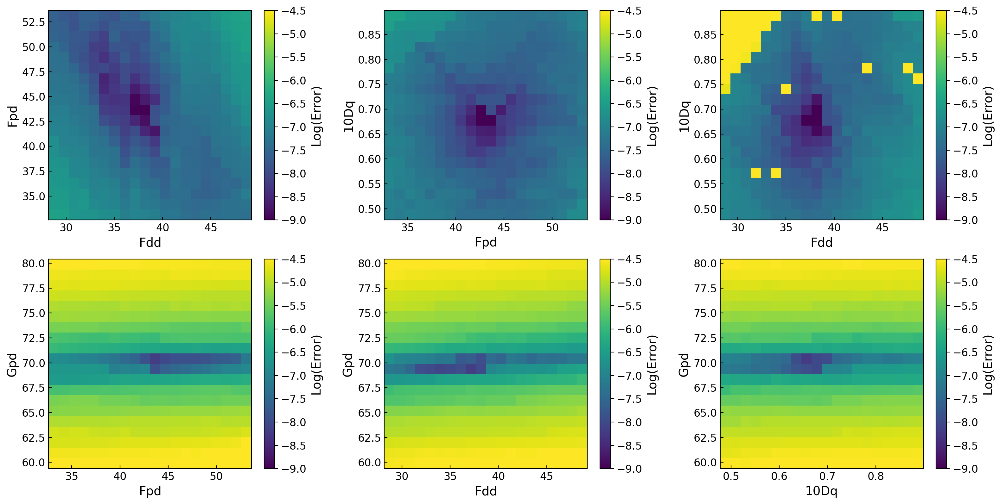

In [15]:
# Define plotting parameters
fig, axs = plt.subplots(2, 3, figsize=(16, 8), dpi=200)
fig.subplots_adjust(wspace=5.0) 

i = 24
g = 0
for f in range(4):
    for s in range(f+1, 4):
        
        # If the output result exists
        fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
        file = Path(fname)
        # print(fname)
        # print(fname)
        # print(f, s)
        if file.exists():
    
            x_pts = np.load(fname)
            y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")

            # Switch axes for Gpd and Fdd
            if f == 2 and s == 3:
                f = 3
                s = 2
                
            x1_pts = x_pts[f]
            x2_pts = x_pts[s]
            
            # Plot iterations
            c = int(g % 3)
            r = int(g / 3)

            if c == 1:
                r = 1 - r
    
            # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
            mp = axs[r][c].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
            
            axs[r][c].tick_params(direction="in", labelsize=12)
            axs[r][c].set_xlabel(axes[f], fontsize=14)
            axs[r][c].set_ylabel(axes[s], fontsize=14)
            cb = fig.colorbar(mp, ax=axs[r][c])
            cb.set_label(label="Log(Error)", size=14)
            cb.ax.tick_params(labelsize=12)
    
    
            # sol_y = np.linspace(0, 0.02, 100)
            # sol_x = np.full_like(sol_y, tdq_vals[i])
            # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
            
            # axs[r, c].legend(fontsize=8)
            g += 1
            # axs[1].legend()
            # print(tdq_pred)
            # print(tdq_act)
    
    # plt.show()
    # print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./figures/paper/coo_hmap_rs{i}pts.png")

# Co3+ Error Landscape

## 4 Variable Error Landscape

### Read in test data

In [16]:
hs_df = pd.read_pickle("./theo_specs/co3+_4var_lstspecs_norm.pkl")

hs_df["PE"] = hs_df["10Dq"]/hs_df["Fdd"] * 100
hs_df.sort_values(by="PE", ascending=True, inplace=True)
hs_df.reset_index(drop = True, inplace=True)
gpd_vals = hs_df["Gpd"].to_numpy(dtype="float")
fdd_vals = hs_df["Fdd"].to_numpy(dtype="float")
tdq_vals = hs_df["10Dq"].to_numpy(dtype="float")
fpd_vals = hs_df["Fpd"].to_numpy(dtype="float")

hs_df

,Fdd,10Dq,Gpd,Fpd,Spectrum,SpinState,PE
0,74.587318,2.016465,66.182074,90.249099,xData yData 0 7620.0 0.000064 1 ...,LS,2.703496
1,77.987939,2.123076,54.597305,64.998098,xData yData 0 7620.0 0.000059 1 ...,LS,2.722313
2,87.109749,2.379185,75.164326,43.589084,xData yData 0 7620.0 0.000067 1 ...,LS,2.731250
3,98.658474,2.734059,87.282387,35.058569,xData yData 0 7620.0 0.000072 1 ...,LS,2.771236
4,66.774803,1.910774,89.247802,36.143752,xData yData 0 7620.0 0.000074 1 ...,LS,2.861519
5,73.076958,2.109766,66.586234,70.438152,xData yData 0 7620.0 0.000064 1 ...,LS,2.887046
6,55.045664,1.589196,82.894953,83.614198,xData yData 0 7620.0 0.000071 1 ...,LS,2.887051
7,95.383046,2.797167,85.597422,93.883535,xData yData 0 7620.0 0.000072 1 ...,LS,2.932563
8,90.018299,2.714566,67.615086,66.640431,xData yData 0 7620.0 0.000064 1 ...,LS,3.015571
9,90.422525,2.727181,74.808538,30.448622,xData yData 0 7620.0 0.000066 1 ...,LS,3.016042


### Establish directory and filenames

In [17]:
source = "./licoo2_eval/4var_err_land/"

wids = [10, 10, 10, 0.2]
npts = [20, 20, 20, 20]
labels = ["fdd", "fpd", "gpd", "tdq"]
axes = ["Fdd", "Fpd", "Gpd", "10Dq"]

### Plot Fdd, Fpd heatmaps

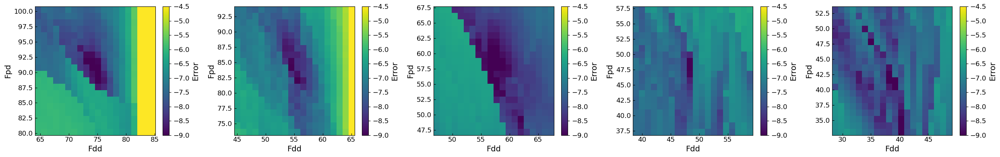

In [20]:
f = 0
s = 1


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].tick_params(direction="in", labelsize=12)
        axs[g].set_xlabel(axes[f], fontsize=14)
        axs[g].set_ylabel(axes[s], fontsize=14)
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=14)
        cb.ax.tick_params(labelsize=12)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fdd, Gpd heatmaps

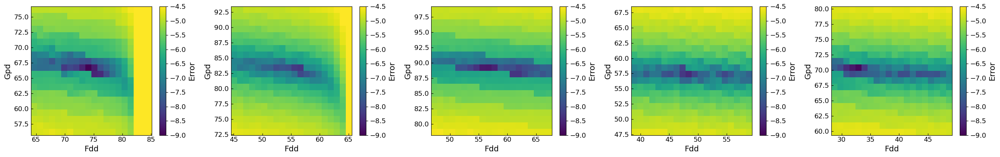

In [21]:
f = 0
s = 2


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        axs[g].tick_params(direction="in", labelsize=12)
        axs[g].set_xlabel(axes[f], fontsize=14)
        axs[g].set_ylabel(axes[s], fontsize=14)
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=14)
        cb.ax.tick_params(labelsize=12)


        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fdd, 10Dq heatmaps

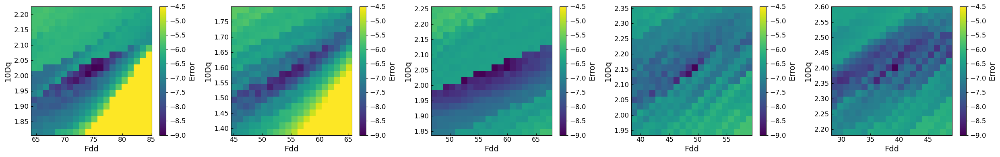

In [22]:
f = 0
s = 3


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        axs[g].tick_params(direction="in", labelsize=12)
        axs[g].set_xlabel(axes[f], fontsize=14)
        axs[g].set_ylabel(axes[s], fontsize=14)
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=14)
        cb.ax.tick_params(labelsize=12)


        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fpd, Gpd heatmaps

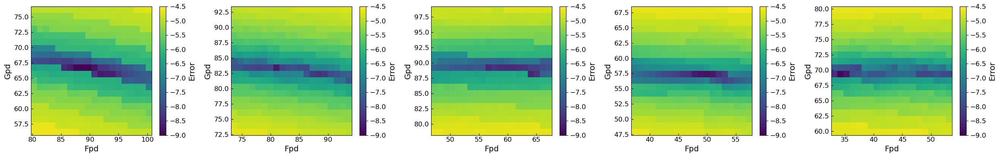

In [23]:
f = 1
s = 2


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        axs[g].tick_params(direction="in", labelsize=12)
        axs[g].set_xlabel(axes[f], fontsize=14)
        axs[g].set_ylabel(axes[s], fontsize=14)
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=14)
        cb.ax.tick_params(labelsize=12)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Fpd, 10Dq heatmaps

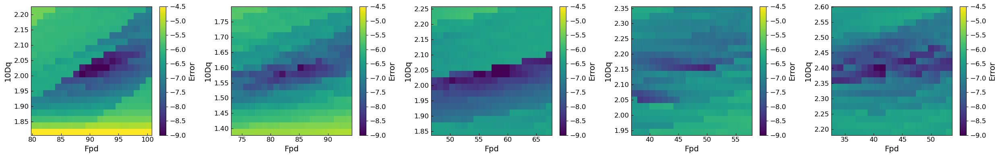

In [24]:
f = 1
s = 3


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        axs[g].tick_params(direction="in", labelsize=12)
        axs[g].set_xlabel(axes[f], fontsize=14)
        axs[g].set_ylabel(axes[s], fontsize=14)
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=14)
        cb.ax.tick_params(labelsize=12)


        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot Gpd, 10Dq heatmaps

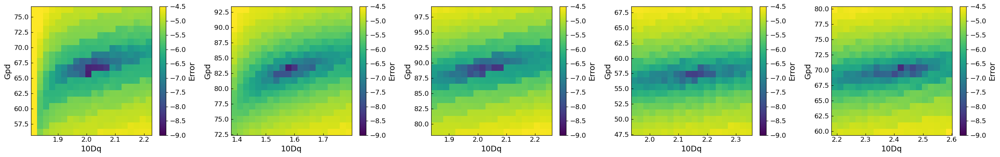

In [25]:
# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
    f = 2
    s = 3

# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")
        f = 3
        s = 2
        x1_pts = x_pts[f]
        x2_pts = x_pts[s]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        axs[g].tick_params(direction="in", labelsize=12)
        axs[g].set_xlabel(axes[f], fontsize=14)
        axs[g].set_ylabel(axes[s], fontsize=14)
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=14)
        cb.ax.tick_params(labelsize=12)


        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"{source}figures/hmap_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts.png")

### Plot presentation figures

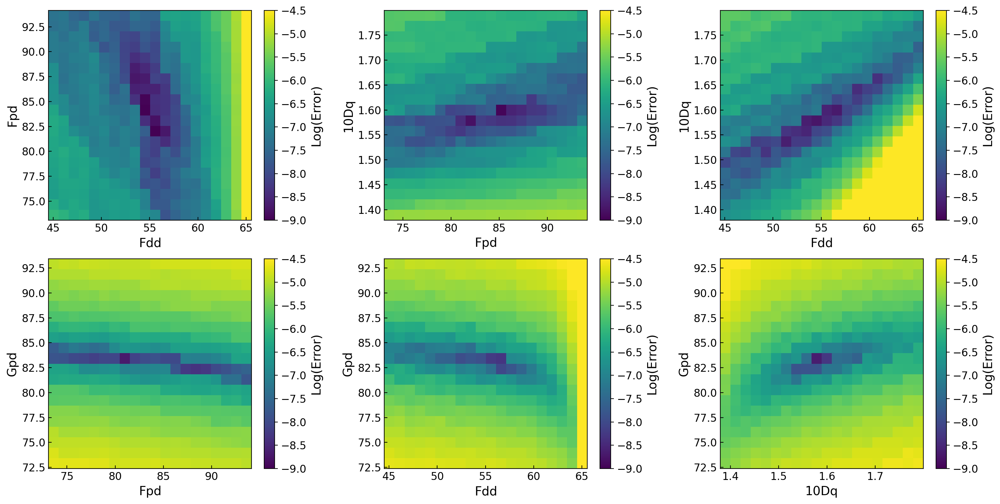

In [19]:
# Define plotting parameters
fig, axs = plt.subplots(2, 3, figsize=(16, 8), dpi=200)
fig.subplots_adjust(wspace=5.0) 

i = 6
g = 0
for f in range(4):
    for s in range(f+1, 4):
        
        # If the output result exists
        fname = f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_x_pts.npy"
        file = Path(fname)
        # print(fname)
        # print(fname)
        # print(f, s)
        if file.exists():
    
            x_pts = np.load(fname)
            y_pts = np.load(f"{source}{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{wids[f]}{labels[f]}_{npts[f]}pts_{wids[s]}{labels[s]}_{npts[s]}pts_err_pts.npy")

            # Switch axes for Gpd and Fdd
            if f == 2 and s == 3:
                f = 3
                s = 2
                
            x1_pts = x_pts[f]
            x2_pts = x_pts[s]
            
            # Plot iterations
            c = int(g % 3)
            r = int(g / 3)

            if c == 1:
                r = 1 - r
    
            # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
            mp = axs[r][c].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
            
            axs[r][c].tick_params(direction="in", labelsize=12)
            axs[r][c].set_xlabel(axes[f], fontsize=14)
            axs[r][c].set_ylabel(axes[s], fontsize=14)
            cb = fig.colorbar(mp, ax=axs[r][c])
            cb.set_label(label="Log(Error)", size=14)
            cb.ax.tick_params(labelsize=12)
    
    
            # sol_y = np.linspace(0, 0.02, 100)
            # sol_x = np.full_like(sol_y, tdq_vals[i])
            # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
            
            # axs[r, c].legend(fontsize=8)
            g += 1
            # axs[1].legend()
            # print(tdq_pred)
            # print(tdq_act)
    
    # plt.show()
    # print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./figures/paper/licoo2_hmap_rs{i}pts.png")

# Old Code

### Read in test data

In [74]:
hs_df = pd.read_pickle("./theo_specs/co3+_4var_lstspecs_norm.pkl")

hs_df["PE"] = hs_df["10Dq"]/hs_df["Fdd"] * 100
hs_df.sort_values(by="PE", ascending=True, inplace=True)
hs_df.reset_index(drop = True, inplace=True)
gpd_vals = hs_df["Gpd"].to_numpy(dtype="float")
fdd_vals = hs_df["Fdd"].to_numpy(dtype="float")
tdq_vals = hs_df["10Dq"].to_numpy(dtype="float")
fpd_vals = hs_df["Fpd"].to_numpy(dtype="float")

hs_df

,Fdd,10Dq,Gpd,Fpd,Spectrum,SpinState,PE
0,74.587318,2.016465,66.182074,90.249099,xData yData 0 7620.0 0.000064 1 ...,LS,2.703496
1,77.987939,2.123076,54.597305,64.998098,xData yData 0 7620.0 0.000059 1 ...,LS,2.722313
2,87.109749,2.379185,75.164326,43.589084,xData yData 0 7620.0 0.000067 1 ...,LS,2.731250
3,98.658474,2.734059,87.282387,35.058569,xData yData 0 7620.0 0.000072 1 ...,LS,2.771236
4,66.774803,1.910774,89.247802,36.143752,xData yData 0 7620.0 0.000074 1 ...,LS,2.861519
5,73.076958,2.109766,66.586234,70.438152,xData yData 0 7620.0 0.000064 1 ...,LS,2.887046
6,55.045664,1.589196,82.894953,83.614198,xData yData 0 7620.0 0.000071 1 ...,LS,2.887051
7,95.383046,2.797167,85.597422,93.883535,xData yData 0 7620.0 0.000072 1 ...,LS,2.932563
8,90.018299,2.714566,67.615086,66.640431,xData yData 0 7620.0 0.000064 1 ...,LS,3.015571
9,90.422525,2.727181,74.808538,30.448622,xData yData 0 7620.0 0.000066 1 ...,LS,3.016042


### Plot Fdd, Fpd Landscape by Fdd value

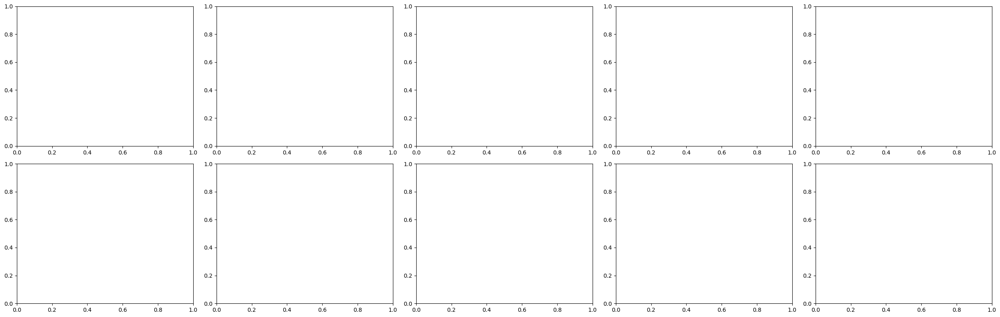

In [17]:
# Define width we want to test at
fpd_wid = 5
fdd_wid = 5
fpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        fpd_pts = x_pts[1]
        gpd = gpd_vals[i]
        tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fdd_pts, y_pts, c=fpd_pts, cmap="viridis", label=f"Gpd={gpd_vals[i]:0.2f}, 10Dq={tdq_vals[i]:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fdd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.ax.tick_params(labelsize=12)

        # cb.set_label(label="Iter", size=16)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./licoo2_eval/4var_err_land/figures/{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_byfdd_cfpd_err.png")

### Plot Fdd, Fpd Landscape by Fpd value

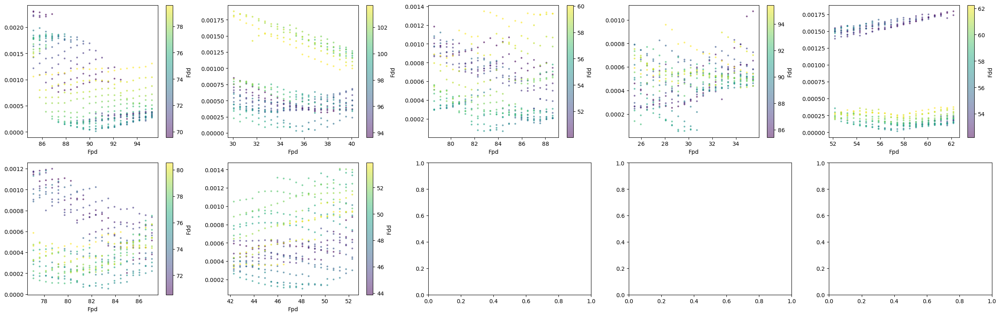

In [12]:
# Define width we want to test at
fpd_wid = 5
fdd_wid = 5
fpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        fpd_pts = x_pts[1]
        gpd = gpd_vals[i]
        tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fpd_pts, y_pts, c=fdd_pts, cmap="viridis", label=f"Gpd={gpd_vals[i]:0.2f}, 10Dq={tdq_vals[i]:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fpd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Fdd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./licoo2_eval/4var_err_land/figures/{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_byfpd_cfdd_err.png")

### Plot Fdd, Gpd Landscape by Gpd value

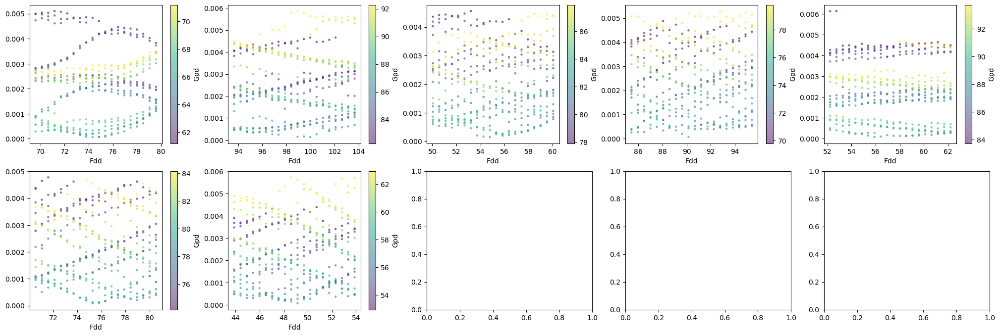

In [13]:
# Define width we want to test at
gpd_wid = 5
fdd_wid = 5
gpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{gpd_wid}gpd_{gpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{gpd_wid}gpd_{gpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        gpd_pts = x_pts[2]
        fpd = fpd_vals[i]
        tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fdd_pts, y_pts, c=gpd_pts, cmap="viridis", label=f"Fpd={fpd:0.2f}, 10Dq={tdq:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fdd")
        # axs[r, c].set_ylabel("Gpd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Gpd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./licoo2_eval/4var_err_land/figures/{fdd_wid}fdd_{fdd_npts}pts_{gpd_wid}gpd_{gpd_npts}pts_byfdd_cgpd_err.png")

### Plot Fdd, Gpd Landscape by Gpd value

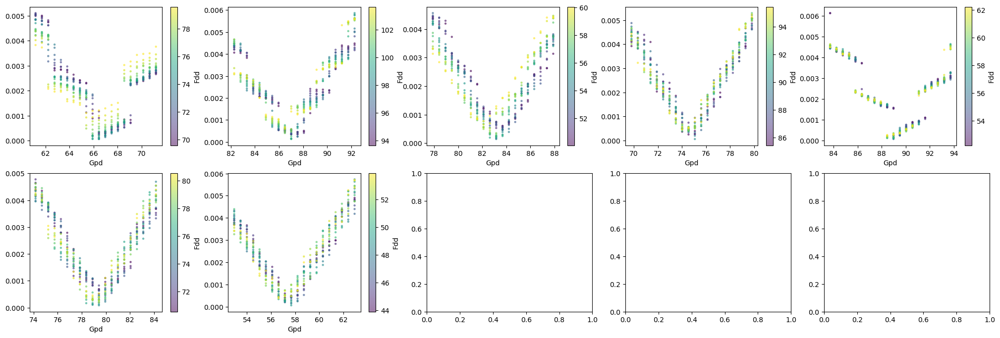

In [14]:
# Define width we want to test at
gpd_wid = 5
fdd_wid = 5
gpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{gpd_wid}gpd_{gpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{gpd_wid}gpd_{gpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        gpd_pts = x_pts[2]
        fpd = fpd_vals[i]
        tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(gpd_pts, y_pts, c=fdd_pts, cmap="viridis", label=f"Fpd={fpd:0.2f}, 10Dq={tdq:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Gpd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Fdd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./licoo2_eval/4var_err_land/figures/{fdd_wid}fdd_{fdd_npts}pts_{gpd_wid}gpd_{gpd_npts}pts_bygpd_cfdd_err.png")

### Plot Fdd, 10Dq Landscape by Fdd value

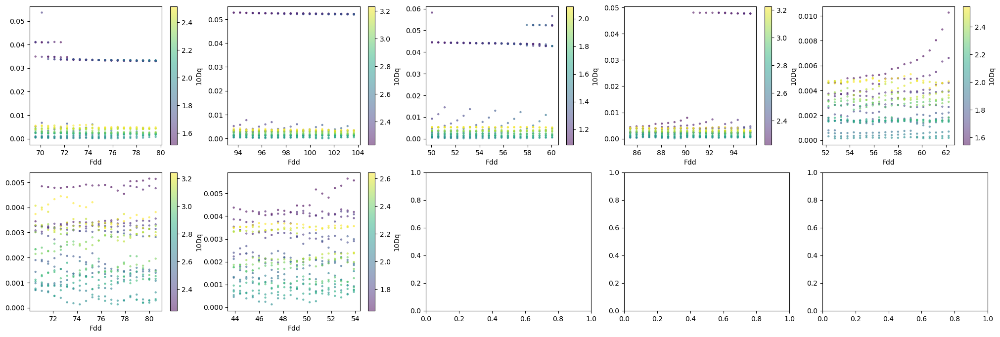

In [15]:
# Define width we want to test at
var1_wid = 5
var2_wid = .5
var1_npts = 20
var2_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fdd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fdd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        tdq_pts = x_pts[3]
        gpd = gpd_vals[i]
        fpd = fpd_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fdd_pts, y_pts, c=tdq_pts, cmap="viridis", label=f"Fpd={fpd:0.2f}, Gpd={gpd:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fdd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="10Dq", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./licoo2_eval/4var_err_land/figures/{var1_wid}fdd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_byfdd_ctdq_err.png")

### Plot Fdd, 10Dq Landscape by 10Dq value

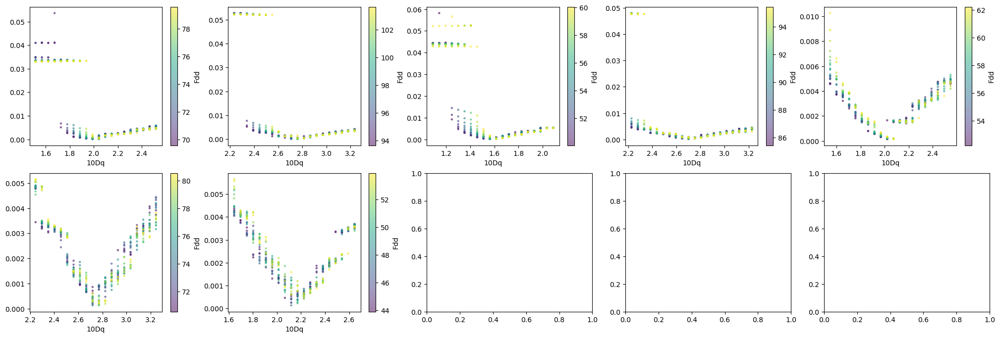

In [16]:
# Define width we want to test at
var1_wid = 5
var2_wid = .5
var1_npts = 20
var2_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fdd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fdd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        tdq_pts = x_pts[3]
        gpd = gpd_vals[i]
        fpd = fpd_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(tdq_pts, y_pts, c=fdd_pts, cmap="viridis", label=f"Fpd={fpd:0.2f}, Gpd={gpd:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("10Dq")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Fdd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./licoo2_eval/4var_err_land/figures/{var1_wid}fdd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_bytdq_cfdd_err.png")

### Plot Fpd, Gpd Landscape by Fpd value

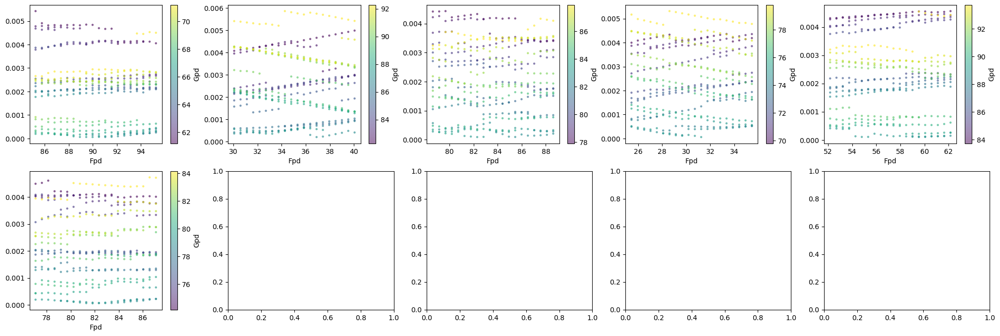

In [17]:
# Define width we want to test at
var1_wid = 5
var2_wid = 5
var1_npts = 20
var2_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}gpd_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}gpd_{var2_npts}pts_err_pts.npy")
        fpd_pts = x_pts[1]
        gpd_pts = x_pts[2]
        fdd = fdd_vals[i]
        tdq = tdq_vals[i]

        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fpd_pts, y_pts, c=gpd_pts, cmap="viridis", label=f"Fdd={fdd:0.2f}, 10Dq={tdq:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fpd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Gpd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./licoo2_eval/4var_err_land/figures/{var1_wid}fpd_{var1_npts}pts_{var2_wid}gpd_{var2_npts}pts_byfpd_cgpd_err.png")

### Plot Fpd, Gpd Landscape by Gpd value

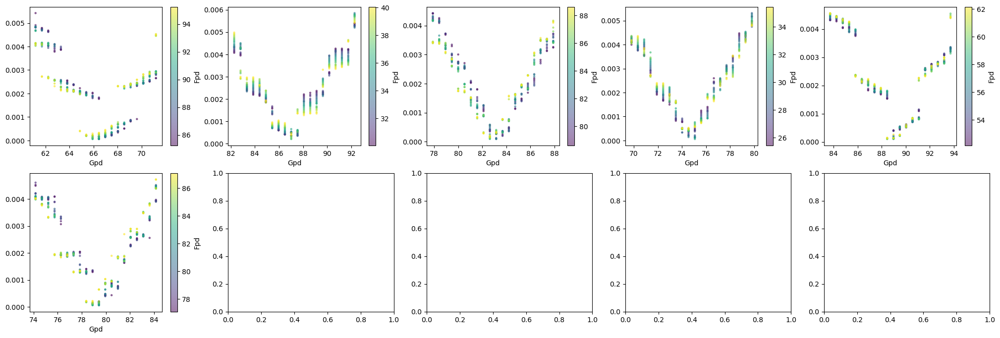

In [18]:
# Define width we want to test at
var1_wid = 5
var2_wid = 5
var1_npts = 20
var2_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}gpd_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}gpd_{var2_npts}pts_err_pts.npy")
        fpd_pts = x_pts[1]
        gpd_pts = x_pts[2]
        fdd = fdd_vals[i]
        tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(gpd_pts, y_pts, c=fpd_pts, cmap="viridis", label=f"Fdd={fdd:0.2f}, 10Dq={tdq:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Gpd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Fpd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./licoo2_eval/4var_err_land/figures/{var1_wid}fpd_{var1_npts}pts_{var2_wid}gpd_{var2_npts}pts_bygpd_cfpd_err.png")

### Plot Fpd, 10Dq Landscape by Fpd value

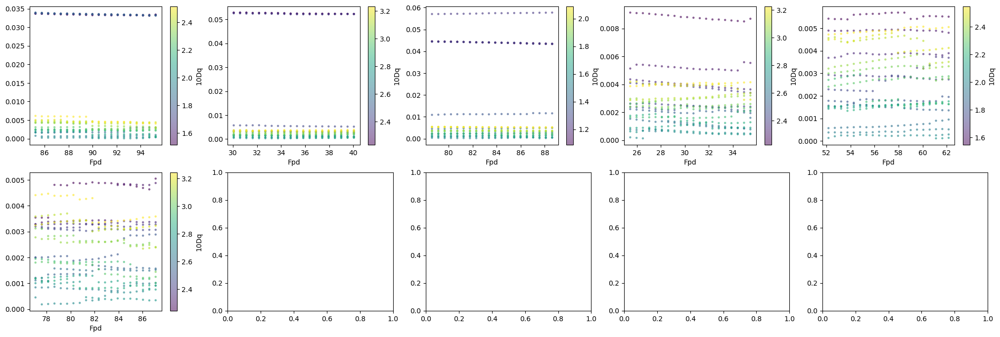

In [19]:
# Define width we want to test at
var1_wid = 5
var2_wid = .5
var1_npts = 20
var2_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_err_pts.npy")
        fpd_pts = x_pts[1]
        tdq_pts = x_pts[3]
        fdd = fdd_vals[i]
        gpd = gpd_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(fpd_pts, y_pts, c=tdq_pts, cmap="viridis", label=f"Fdd={fdd:0.2f}, Gpd={gpd:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Fpd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="10Dq", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./licoo2_eval/4var_err_land/figures/{var1_wid}fpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_byfpd_ctdq_err.png")

### Plot Fpd, 10Dq Landscape by 10Dq value

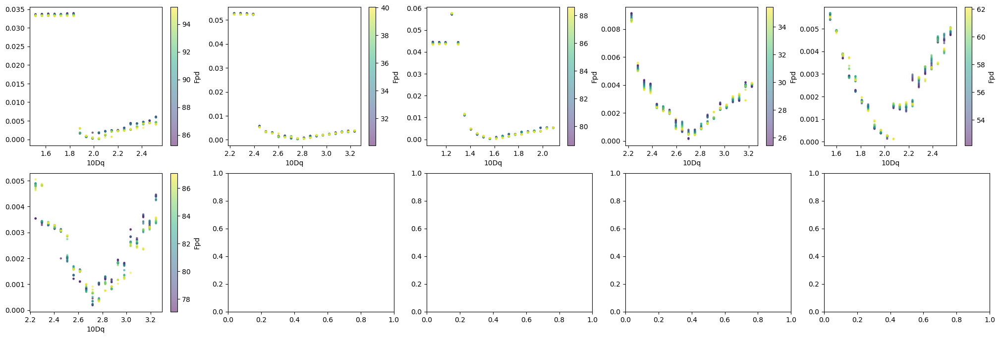

In [20]:
# Define width we want to test at
var1_wid = 5
var2_wid = .5
var1_npts = 20
var2_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}fpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_err_pts.npy")
        fpd_pts = x_pts[1]
        tdq_pts = x_pts[3]
        fdd = fdd_vals[i]
        gpd = gpd_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(tdq_pts, y_pts, c=fpd_pts, cmap="viridis", label=f"Fdd={fdd:0.2f}, Gpd={gpd:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("10Dq")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Fpd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=10)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./licoo2_eval/4var_err_land/figures/{var1_wid}fpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_bytdq_cfpd_err.png")

### Plot Gpd, 10Dq Landscape by Gpd value

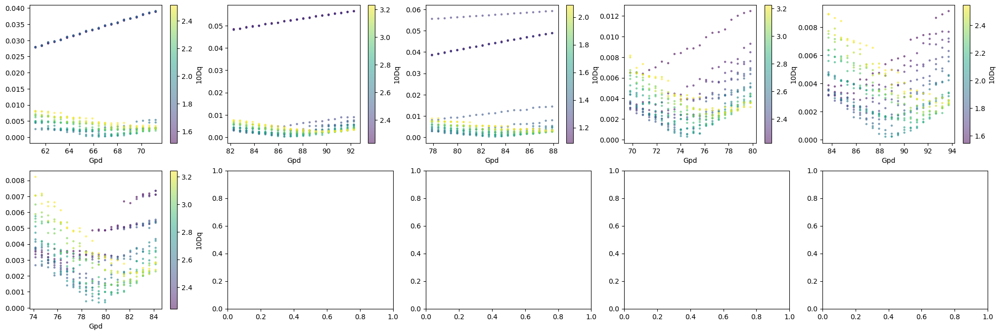

In [21]:
# Define width we want to test at
var1_wid = 5
var2_wid = .5
var1_npts = 20
var2_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}gpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}gpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_err_pts.npy")
        gpd_pts = x_pts[2]
        tdq_pts = x_pts[3]
        fdd = fdd_vals[i]
        fpd = fpd_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(gpd_pts, y_pts, c=tdq_pts, cmap="viridis", label=f"Fdd={fdd:0.2f}, Fpd={fpd:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("Gpd")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="10Dq", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(loc="upper right")
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./licoo2_eval/4var_err_land/figures/{var1_wid}gpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_bygpd_ctdq_err.png")

### Plot Gpd, 10Dq Landscape by 10Dq value

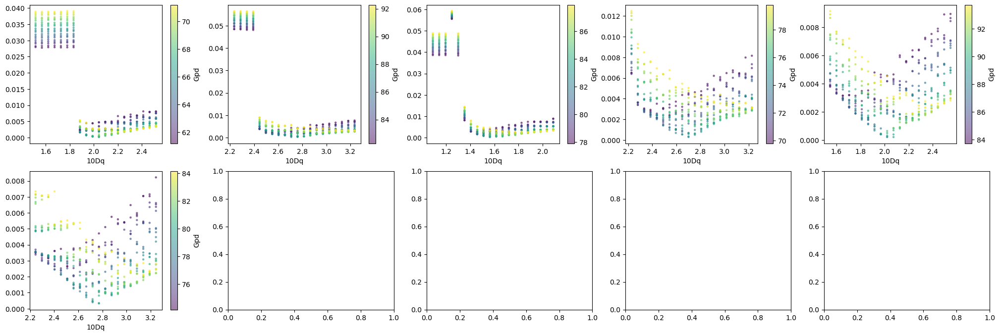

In [22]:
# Define width we want to test at
var1_wid = 5
var2_wid = .5
var1_npts = 20
var2_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(2, 5, figsize=(25, 8))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}gpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{var1_wid}gpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_err_pts.npy")
        gpd_pts = x_pts[2]
        tdq_pts = x_pts[3]
        fdd = fdd_vals[i]
        fpd = fpd_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)
        mp = axs[r, c].scatter(tdq_pts, y_pts, c=gpd_pts, cmap="viridis", label=f"Fdd={fdd:0.2f}, Fpd={fpd:0.2f}", s=5, alpha=0.5)
        # axs[r, c].set_ylim(0, 0.01)
        # axs[r, c].set_ylabel("Error")
        axs[r, c].set_xlabel("10Dq")
        cb = fig.colorbar(mp, ax=axs[r, c])
        cb.set_label(label="Gpd", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=10)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.savefig(f"./licoo2_eval/4var_err_land/figures/{var1_wid}gpd_{var1_npts}pts_{var2_wid}tdq_{var2_npts}pts_bytdq_cgpd_err.png")

### Plot Fdd, Fpd heatmaps

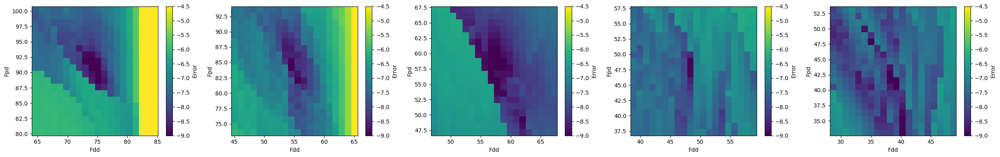

In [75]:
from scipy.interpolate import RegularGridInterpolator as RGI

# Define width we want to test at
fpd_wid = 10
fdd_wid = 10
fpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts_err_pts.npy")
        x1_pts = x_pts[0]
        x2_pts = x_pts[1]
        gpd = gpd_vals[i]
        tdq = tdq_vals[i]

        # Unravel arrays for interpolation. 
        # x_flat = fdd_pts.ravel()
        # y_flat = fpd_pts.ravel()
        # z_flat = y_pts.ravel()

        # print(x1_pts[0])
        # print(x2_pts[:, 0])
        # reg_interp = RGI((x1_pts[0], x2_pts[:, 0]), y_pts)

        # x1_finearr = np.linspace(np.min(x1_pts), np.max(x1_pts), 100)
        # x2_finearr = np.linspace(np.min(x2_pts), np.max(x2_pts), 100)
        # x1_fine, x2_fine = np.meshgrid(x1_finearr, x2_finearr, indexing="ij")

        # y_fine = reg_interp(np.array([x1_fine.ravel(), x2_fine.ravel()]).T).reshape(x1_fine.shape)

        # print(y_fine.shape)

        # print(x1_pts)
        # print(x_fine.ravel())
        # z_fine = interpn((x1_pts, x2_pts), y_pts, np.array([x_fine.ravel(), y_fine.ravel()]).T, method="cubic")
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        # mp = axs[r, c].pcolormesh(x1_fine, x2_fine, y_fine, cmap="viridis")
        mp = axs[g].pcolormesh(x1_pts, x2_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel("Fdd")
        axs[g].set_ylabel("Fpd")
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./licoo2_eval/4var_err_land/figures/hmap_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}fpd_{fpd_npts}pts.png")

### Plot Fdd, Gpd heatmaps

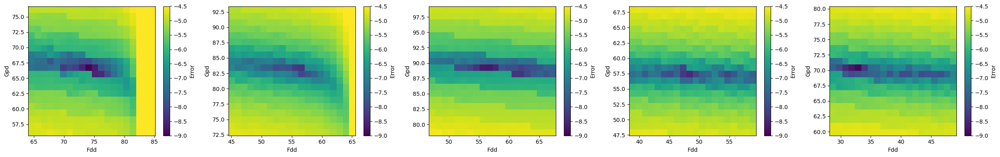

In [76]:
# Define width we want to test at
fpd_wid = 10
fdd_wid = 10
fpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}gpd_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}gpd_{fpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        gpd_pts = x_pts[2]
        # gpd = gpd_vals[i]
        # tdq = tdq_vals[i]

        mp = axs[g].pcolormesh(fdd_pts, gpd_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel("Fdd")
        axs[g].set_ylabel("Gpd")
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./licoo2_eval/4var_err_land/figures/hmap_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}gpd_{fpd_npts}pts.png")

### Plot Fdd, 10Dq heatmaps

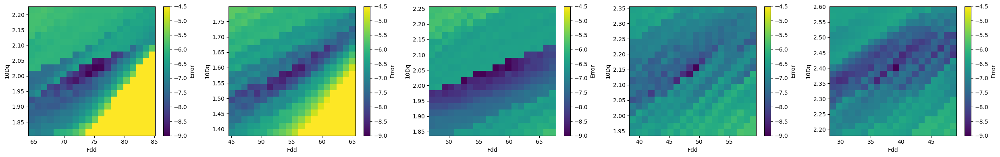

In [77]:
# Define width we want to test at
fpd_wid = .2
fdd_wid = 10
fpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts_err_pts.npy")
        fdd_pts = x_pts[0]
        tdq_pts = x_pts[3]
        # gpd = gpd_vals[i]
        # tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        mp = axs[g].pcolormesh(fdd_pts, tdq_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel("Fdd")
        axs[g].set_ylabel("10Dq")
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./licoo2_eval/4var_err_land/figures/hmap_{fdd_wid}fdd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts.png")

### Plot Fpd, Gpd heatmaps

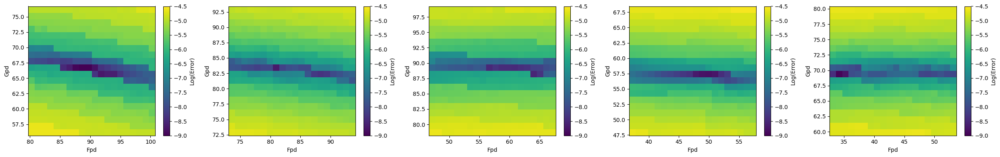

In [78]:
# Define width we want to test at
fpd_wid = 10
fdd_wid = 10
fpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fpd_{fdd_npts}pts_{fpd_wid}gpd_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fpd_{fdd_npts}pts_{fpd_wid}gpd_{fpd_npts}pts_err_pts.npy")
        fpd_pts = x_pts[1]
        gpd_pts = x_pts[2]
        # gpd = gpd_vals[i]
        # tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        mp = axs[g].pcolormesh(fpd_pts, gpd_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel("Fpd")
        axs[g].set_ylabel("Gpd")
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Log(Error)", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./licoo2_eval/4var_err_land/figures/hmap_{fdd_wid}fpd_{fdd_npts}pts_{fpd_wid}gpd_{fpd_npts}pts.png")

### Plot Fpd, 10Dq heatmaps

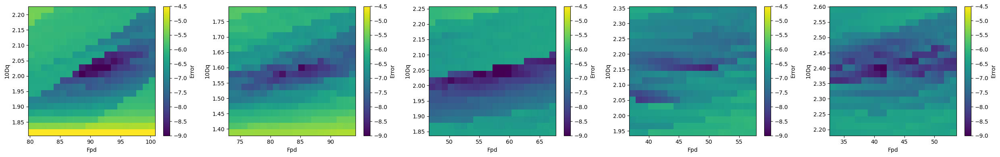

In [79]:
# Define width we want to test at
fpd_wid = .2
fdd_wid = 10
fpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fpd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}fpd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts_err_pts.npy")
        fpd_pts = x_pts[1]
        tdq_pts = x_pts[3]
        # gpd = gpd_vals[i]
        # tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        mp = axs[g].pcolormesh(fpd_pts, tdq_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel("Fpd")
        axs[g].set_ylabel("10Dq")
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./licoo2_eval/4var_err_land/figures/hmap_{fdd_wid}fpd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts.png")

### Plot Gpd, 10Dq heatmaps

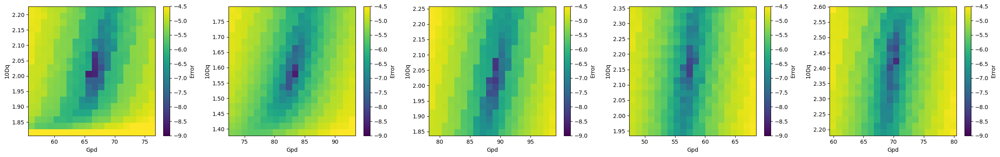

In [80]:
# Define width we want to test at
fpd_wid = .2
fdd_wid = 10
fpd_npts = 20
fdd_npts = 20


# Define plotting parameters
fig, axs = plt.subplots(1, 5, figsize=(25, 4))

n = 25
iters = np.arange(0, 10)

# print(gpd_vals)
g = 0
for i in range(gpd_vals.shape[0]):
# for i in range(5):
    # print(gpd_vals[i])

    # If the output result exists
    fname = f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}gpd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts_x_pts.npy"
    file = Path(fname)
    # print(fname)
    # print(fname)
    if file.exists():

        x_pts = np.load(fname)
        y_pts = np.load(f"./licoo2_eval/4var_err_land/{fdd_vals[i]}_{fpd_vals[i]}_{gpd_vals[i]}_{tdq_vals[i]}_{fdd_wid}gpd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts_err_pts.npy")
        gpd_pts = x_pts[2]
        tdq_pts = x_pts[3]
        # gpd = gpd_vals[i]
        # tdq = tdq_vals[i]
        
        # Plot iterations
        c = int(g % 5)
        r = int(g / 5)

        mp = axs[g].pcolormesh(gpd_pts, tdq_pts, np.log(y_pts), cmap="viridis", vmin=-9.0, vmax=-4.5)
        
        # axs[r, c].set_ylim(0, 0.02)
        # axs[r, c].set_ylabel("Error")
        axs[g].set_xlabel("Gpd")
        axs[g].set_ylabel("10Dq")
        cb = fig.colorbar(mp, ax=axs[g])
        cb.set_label(label="Error", size=10)

        # sol_y = np.linspace(0, 0.02, 100)
        # sol_x = np.full_like(sol_y, tdq_vals[i])
        # axs[r, c].plot(sol_x, sol_y, "-.", c="red")
        
        # axs[r, c].legend(fontsize=8)
        g += 1
        # axs[1].legend()
        # print(tdq_pred)
        # print(tdq_act)

# plt.show()
# print(on_pts/(on_pts+off_pts))
plt.tight_layout()
plt.savefig(f"./licoo2_eval/4var_err_land/figures/hmap_{fdd_wid}gpd_{fdd_npts}pts_{fpd_wid}tdq_{fpd_npts}pts.png")